# E-commerce — Выявление профилей потребления

**Цель исследования**
Сегментировать покупателей по профилю потребления для создания более персонализированных предложений.

1. Выбор датасета ('ecommerce_dataset.csv')
2. Загрузка и изучение общей информации
- info(), describe(), duplicated()
- описание данных в столбцах
3. Преобработка данных
- удаление явных дубликатов
- удаление неявных дубликатов (дубликаты, содержащие разную дату, но все остальные столбцы идентичные - сохраняем только заказы, где интервал между мин и мах датой <6 дней; дубликаты, где для одного `order_id` соответствует несколько `customer_id` - их всего 29, поэтому удалим из датафрейма)
- изучение аномальных значений в столбцах `quantity` и `price`
4. Выделение категорий товаров
- разбиваем столбец `product` на слова (разделитель - запятая), лимматизируем слова, считаем их количество
- по самым популярным словам выделяем категории товаров (до 10 категорий максимально)
- создаем словарь слов для каждой категории товаров
- при помощи функции категоризируем данные
5. Исследовательский анализ данных

- добавление столбца `revenue` со стоимостью заказа
- период изучения данных
- количество уникальных пользователей
- количество уникальных товаров
- количество уникальных заказов
- общая выручка и выручка по категориям товаров (pie chart)
- точечный график количества заказов на пользователя по группам
- точечный график стоимостей заказов по группам
- динамика выручки по месяцам
- динамика количества заказов по месяцам
- динамика уникальных покупателей по месяцам
- динамика среднего чека по месяцам
6. Сегментация покупателей
- метод RPM-анализ, где 

R - давность, как давно клиент совершил покупку (интервал между моментом анализа (последняя дата в датафрейме), и датой совершения транзакции)

F - как часто они совершают покупку (общее количество покупок заказов)

M - денежная ценность (средний чек клиента)

7. Изучение каждого сегмента покупателей
- количество уникальных клиентов в каждом сегменте
- количество уникальных заказов в каждом сегменте
- средний чек сегмента
- точечный график количества заказов на пользователя по сегментам
- популярные категории товаров в каждом сегменте 
- динамика количества покупок по месяцам для каждого сегмента в разбивке по товарным категориям

8. Проверка гипотез
9. Рекомендации

In [1]:
#!pip install pymorphy2

In [2]:
#импорт библиотек
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
from collections import Counter

In [3]:
#импорт библиотек
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import scipy.stats as stats
import numpy as np
import seaborn as sn
from matplotlib import pyplot as plt
import datetime as dt
import math
import plotly.express as px
from datetime import timedelta, datetime

#from IPython.display import display
#from pandas.plotting import register_matplotlib_converters
#register_matplotlib_converters()

##  Обзор данных

In [4]:
#загружаем данные
data = pd.read_csv('https://code.s3.yandex.net/datasets/ecommerce_dataset.csv')

In [5]:
#функция для вывода основных методов при исследовании данных
def data_research(df):
    print('Вывод первых 5 строк датафрейма')
    print('*'*50)
    display(df.head())
    print('*'*50)
    print('Описание данных методом describe()')
    print('*'*50)
    display(df.describe().T)
    print('*'*50)
    print('Описание данных методом info()')
    print('*'*50)
    df.info()
    print('*'*50)
    print('Количество дубликатов')
    print('*'*50)
    print(df.duplicated().sum())

In [6]:
data_research(data)

Вывод первых 5 строк датафрейма
**************************************************


,date,customer_id,order_id,product,quantity,price
0,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0
1,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0
2,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0
3,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0
4,2018100100,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0


**************************************************
Описание данных методом describe()
**************************************************


,count,mean,std,min,25%,50%,75%,max
date,6737.0,2.018855e+09,385518.465620,2.018100e+09,2.019020e+09,2.019050e+09,2.019061e+09,2.019103e+09
order_id,6737.0,4.312895e+04,27899.414662,1.262400e+04,1.482700e+04,6.850300e+04,7.050400e+04,7.316400e+04
quantity,6737.0,2.501559e+00,15.266478,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+03
price,6737.0,4.620285e+02,871.296064,9.000000e+00,1.010000e+02,1.350000e+02,3.980000e+02,1.491700e+04


**************************************************
Описание данных методом info()
**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6737 entries, 0 to 6736
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         6737 non-null   int64  
 1   customer_id  6737 non-null   object 
 2   order_id     6737 non-null   int64  
 3   product      6737 non-null   object 
 4   quantity     6737 non-null   int64  
 5   price        6737 non-null   float64
dtypes: float64(1), int64(3), object(2)
memory usage: 315.9+ KB
**************************************************
Количество дубликатов
**************************************************
0


**Описание данных**

Датасет описывает транзакции интернет-магазина товаров для дома и быта «Пока все ещё тут».

Колонки в `ecommerce_dataset.csv` : 

`date` — дата заказа;

`customer_id` — идентификатор покупателя;

`order_id`— идентификатор заказа;

`product` — наименование товара;

`quantity` — количество товара в заказе; 

`price` — цена товара.


<div style="border:solid black 1px; padding: 20 px">
    
В датафрейме отсутсвуют явные дубликаты. 

Пропуски в столбцах также отсутствуют. 

Столбец `date` необходимо привести к типу данных datetime (специальный тип для работы с датой и временем).
    
Всего в датафрейме 6737 строк. Далее необходимо детальнее изучить столбцы `quantity` и `price` на наличие аномальных значений, так как метод describe показал наличие значений, сильно смещенных относительно медианы.
</div>

##  Предобработка данных

In [7]:
#сохраним сырые данные
data_row = data

In [8]:
#поменяем тип данных столбца с датой, таким образом, добавим столбец с датой и временем событий
data['date'] = pd.to_datetime(data['date'], format='%Y%m%d%H')

In [9]:
#проверяем тип данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6737 entries, 0 to 6736
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         6737 non-null   datetime64[ns]
 1   customer_id  6737 non-null   object        
 2   order_id     6737 non-null   int64         
 3   product      6737 non-null   object        
 4   quantity     6737 non-null   int64         
 5   price        6737 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(2)
memory usage: 315.9+ KB


In [10]:
# проверим неявные дубликаты по всем столбцам кроме даты
duplicateRows = data[data.duplicated(['customer_id', 'order_id','product','quantity','price'])]
duplicateRows

,date,customer_id,order_id,product,quantity,price
58,2018-10-02 18:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
59,2018-10-02 19:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
60,2018-10-02 20:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
63,2018-10-03 04:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
94,2018-10-04 13:00:00,32de7df8-8d4f-4c84-a7b9-c41d00dd83ba,68522,Эвкалипт Гунни d-17 см h-60 см,1,1409.0
...,...,...,...,...,...,...
6706,2019-10-28 10:00:00,57cc80a2-2610-4eef-9457-e7c3bf0c72f0,70960,Сумка-тележка 2-х колесная Gimi Argo красная,1,1087.0
6711,2019-10-28 21:00:00,cb65d08a-dae7-4890-aef0-bb9f79055e02,73108,Мирт d-9 см h-15 см,1,134.0
6728,2019-10-31 00:00:00,ffaeab76-3a8d-49ee-860f-17273b2fc8a2,73136,"Таз пластмассовый со стиральной доской (Иж), 1...",1,397.0
6729,2019-10-31 02:00:00,ffaeab76-3a8d-49ee-860f-17273b2fc8a2,73136,"Таз пластмассовый со стиральной доской (Иж), 1...",1,397.0


In [11]:
duplicateRows.query('product=="Доска гладильная Eurogold Professional 130х48 см металлическая сетка 35748W"')

,date,customer_id,order_id,product,quantity,price
58,2018-10-02 18:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
59,2018-10-02 19:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
60,2018-10-02 20:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0
63,2018-10-03 04:00:00,b731df05-98fa-4610-8496-716ec530a02c,68474,Доска гладильная Eurogold Professional 130х48 ...,1,3299.0


<div style="border:solid black 1px; padding: 20 px">
Возможно, наличие таких дубликатов обусловлено слитием с нескольких баз данных информации, либо особенностью записи данных в бд, то есть фиксируется запись добавления товара в корзину. Удалим из датафрейма дубликаты, сохранив последнюю повторяющуюся строку.

In [12]:
#удаляем дубликаты, сохранив последнюю строку
data = data.drop_duplicates(['customer_id', 'order_id','product','quantity','price'], keep='last')
len(data)

4873

In [13]:
#неявные дубликаты, где для одного номера заказа несколько идентификаторов пользователей
data_duplicate_customer = data.groupby('order_id', as_index=False)['customer_id'].nunique().sort_values(by='customer_id', ascending=False)
data_duplicate_customer

,order_id,customer_id
2610,72845,4
1914,71480,3
902,69485,3
817,69310,2
1066,69833,2
...,...,...
932,69528,1
934,69532,1
935,69533,1
936,69534,1


In [14]:
#количество строк дубликатов
len(data_duplicate_customer.query('customer_id>1'))

29

<div style="border:solid black 1px; padding: 20 px">
Можно предположить, что наличие данных дубликатов обусловлено техническим сбоем при записи информации. Удалим полностью таких пользователей из датафрейма.                                                   
</div>                                                                                                                   

In [15]:
#выведем order_id для удаления из датафрейма
list_to_drop = data_duplicate_customer.query('customer_id>1')['order_id']
list_to_drop

2610    72845
1914    71480
902     69485
817     69310
1066    69833
2576    72790
2569    72778
248     14872
1939    71542
1712    71054
2004    71663
1542    70726
933     69531
1443    70542
1631    70903
797     69283
1799    71226
1956    71571
862     69410
832     69345
1581    70808
1200    70114
1495    70631
1905    71461
2677    72950
2000    71648
1651    70946
516     68785
2269    72188
Name: order_id, dtype: int64

In [16]:
#составим список пользователей с такими заказами
сustomer_to_drop = data.query('order_id in @list_to_drop')['customer_id']
len(сustomer_to_drop)

66

In [17]:
#очищаем дф от пользователей
data = data.query('customer_id not in @сustomer_to_drop')
data.shape[0]

4793

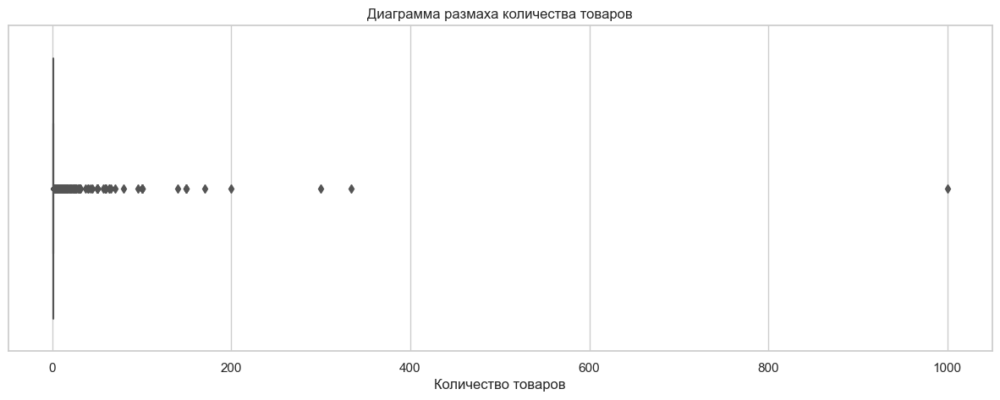

In [18]:
#вспомним о наличии больших значений в столбце 'quantity', изучим данные на boxplot
plt.figure(figsize=(15,5))
sn.set(font_scale= 1)
sn.set_palette("muted")
sn.set_style("whitegrid")
ax = sn.boxplot(x= data['quantity'])
plt.title('Диаграмма размаха количества товаров')
plt.xlabel('Количество товаров')
#plt.legend(bbox_to_anchor=(1.02 , 1), loc='upper left', borderaxespad= 0)
#plt.xticks(rotation = 30)
plt.show()

In [19]:
#посчитаем 90-й, 95-й и 99-й перцентили количества товаров
np.percentile(data['quantity'],[90,95,99])

array([ 3.,  7., 30.])

In [20]:
#посмотрим заказ с количеством позиций >30
data.query('quantity>30')

,date,customer_id,order_id,product,quantity,price
13,2018-10-01 15:00:00,0948b0c2-990b-4a11-b835-69ac4714b21d,68486,Крючок одежный 2-х рожковый серый металлик с п...,96,38.0
144,2018-10-08 15:00:00,9151d307-654c-4239-a888-ada5ca45f0b2,68571,Набор вешалок для костюма 45см 4шт цвет: кремо...,37,202.0
160,2018-10-09 09:00:00,c971fb21-d54c-4134-938f-16b62ee86d3b,68580,"Стяжка оконная с болтом СТ-55 цинк, 1108354",64,19.0
233,2018-10-12 15:00:00,4d93d3f6-8b24-403b-a74b-f5173e40d7db,68623,"Петля приварная гаражная d 14х90 мм с шаром, 1...",50,38.0
266,2018-10-16 08:00:00,cd09ea73-d9ce-48c3-b4c5-018113735e80,68611,"Крепеж для пружины дверной, 1107055",150,19.0
267,2018-10-16 08:00:00,cd09ea73-d9ce-48c3-b4c5-018113735e80,68611,Пружина дверная 240 мм оцинкованная (Д-19 мм) ...,150,38.0
281,2018-10-17 13:00:00,4d93d3f6-8b24-403b-a74b-f5173e40d7db,68668,Щетка для посуды *Мила* SV3182 1807009,50,27.0
282,2018-10-17 13:00:00,4d93d3f6-8b24-403b-a74b-f5173e40d7db,68668,"Щетка-утюжок с ручкой Миди, Standart, York, G1126",50,44.0
568,2018-11-01 08:00:00,aa42dc38-780f-4b50-9a65-83b6fa64e766,68815,Муляж ЯБЛОКО 9 см красное,170,51.0
586,2018-11-02 11:00:00,0c5aaa88-e346-4f87-8f7a-ad8cbc04e965,68831,Муляж ЯБЛОКО 9 см красное,140,59.0


<div style="border:solid black 1px; padding: 20 px">
Вероятно, данные заказы были сделаны в рамках подготовки к какому-нибудь празднику, ремонту или просто единичная оптовая закупка для каких-либо целей (благотворительных). Поэтому они не будут отражать реальной ситуации, и персонализированные предложения будут некорректны. Исключим из рассмотрения пользователей с крупными заказами.  </div> 

In [21]:
#верхняя граница количества заказов
upper_quantity = np.percentile(data['quantity'],99)
#пользователи с количеством позиций больше верхней границы
customer_to_drop = data.query('quantity>@upper_quantity')['customer_id']
data = data.query('customer_id not in @customer_to_drop')
data

,date,customer_id,order_id,product,quantity,price
0,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0
1,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0
2,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0
3,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0
4,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0
...,...,...,...,...,...,...
6732,2019-10-31 11:00:00,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,73156,"Таз пластмассовый 40,0 л пищевой овальный (Иж)...",1,404.0
6733,2019-10-31 12:00:00,1f0a7f35-7459-4f23-b468-5e45bf481dd1,73158,Сумка-тележка 2-х колесная Gimi Argo синяя,1,1087.0
6734,2019-10-31 13:00:00,25df96a7-c453-4708-9cea-a3dfc7c342ea,73162,Герань домашняя (пеларгония зональная) цветуща...,1,157.0
6735,2019-10-31 14:00:00,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,73164,"Таз пластмассовый со стиральной доской (Иж), 1...",1,397.0


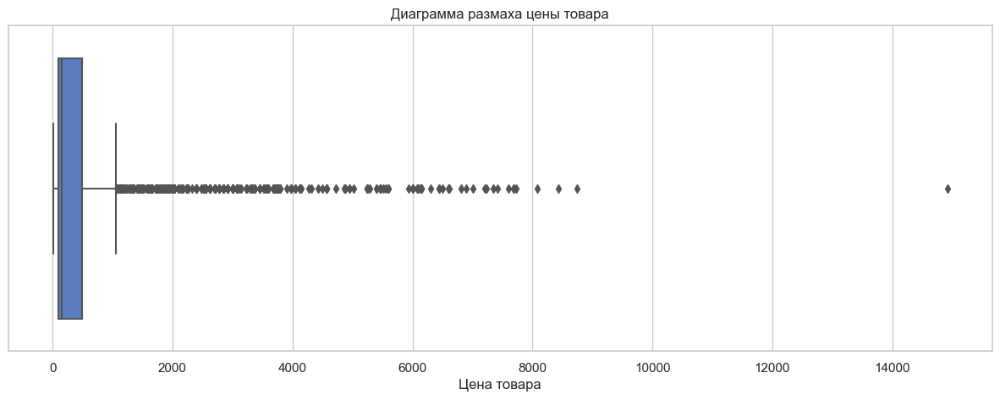

In [22]:
#вспомним о наличии больших значений в столбце 'price', изучим данные на boxplot
plt.figure(figsize=(15,5))
ax = sn.boxplot(x= data['price'])
plt.title('Диаграмма размаха цены товара')
plt.xlabel('Цена товара')
#plt.legend(bbox_to_anchor=(1.02 , 1), loc='upper left', borderaxespad= 0)
#plt.xticks(rotation = 30)
plt.show()

In [23]:
#посчитаем 90-й, 95-й и 99-й перцентили цены товара
np.percentile(data['price'],[90,95,99])

array([1349., 2099., 4949.])

In [24]:
#посмотрим заказы дороже 5000
upper_price = round(np.percentile(data['price'],99),-3)
data.query('price>@upper_price')

,date,customer_id,order_id,product,quantity,price
98,2018-10-04 17:00:00,d1a13243-9111-454f-848c-dcce0958528c,68529,Сумка-тележка хозяйственная Andersen Scala Sho...,1,5024.0
596,2018-11-02 17:00:00,305c9634-ec53-46be-af05-48ee8bd790a5,68836,Сумка-тележка хозяйственная Andersen Scala Sho...,1,5249.0
634,2018-11-05 02:00:00,639c4989-b0ab-412a-b7ec-be394cb2d372,68856,Сумка-тележка хозяйственная Rolser IMX005 mare...,1,6007.0
654,2018-11-05 22:00:00,fc333417-1d11-4a2a-b946-0957ae0603e9,68872,Сумка-тележка хозяйственная Rolser MOU041 malv...,1,7597.0
655,2018-11-05 22:00:00,639c4989-b0ab-412a-b7ec-be394cb2d372,68871,Сумка-тележка хозяйственная Rolser IMX005 mare...,1,6007.0
768,2018-11-11 18:00:00,06e2fc7e-6183-4419-ada4-3b976baeed92,68952,Коврик для ванной комнаты GOBI полиэстер 120х7...,1,5474.0
1121,2018-12-06 17:00:00,82b56a76-0dc9-4dae-aa76-863a9a80f082,69236,Покрывало жаккард KARNA стеганое KALVEN 260x26...,1,6134.0
1122,2018-12-06 17:00:00,fa471f6f-1442-490c-acc6-a47b0822098c,69226,Сумка-тележка хозяйственная Andersen Scala Sho...,1,5249.0
1241,2018-12-17 17:00:00,86c97bf1-c834-423e-9e38-8acda68f97e8,69417,Гладильная доска Leifheit AirBoard Compact M P...,1,7424.0
1420,2018-12-29 09:00:00,ad66d870-22f5-43bc-958f-73420822586b,69681,Сумка-тележка хозяйственная Rolser Pack Gloria...,1,6307.0


In [25]:
#проверим заказы стоимостью 9 денежных единиц
data.query('price==9')

,date,customer_id,order_id,product,quantity,price
1069,2018-12-03 11:00:00,2c8b9386-2e8c-4ee9-8aa4-2b4875b68578,14514,"Алиссум (лобулярия) Снежные одежды 0,2 г 46500...",2,9.0
1078,2018-12-03 11:00:00,2c8b9386-2e8c-4ee9-8aa4-2b4875b68578,14514,"Львиный зев Волшебный ковер 0,05 г 4660010779639",1,9.0
2159,2019-03-04 15:00:00,0f47231c-3a68-404a-88f7-08a4a172c17f,14559,"Горох Амброзия 10,0 г 4660010772616",1,9.0
5642,2019-07-03 22:00:00,1ec1ad59-a29b-4949-929d-f4fc4fe14758,14887,"Алиссум (лобулярия) Снежные одежды 0,2 г 46500...",1,9.0


<div style="border:solid black 1px; padding: 20 px">
В целом, по представленным ценам на товары можно сделать вывод, что денежная единица - рубли.
   
Транзакции с товарами по 9 рублей не являются выбросами - это семена растений. Исключать из анализа не будем.
Также не будем исключать и позиции с высокими ценами - покупатели, которые берут такой товар, кажутся довольно привлекательным сегментом. Убрав их мы можем тем самым потерять часть нашего ассортимента (возможно даже самого прибыльного).
</div> 

In [26]:
print(f'Строк до удаления - {len(data_row)}, после - {len(data)}, потеряли {round(100 - (len(data)/len(data_row)*100),2)} %')

Строк до удаления - 6737, после - 4563, потеряли 32.27 %


In [27]:
print(f'Уникальных пользователей до удаления - {data_row["customer_id"].nunique()}, после - {data["customer_id"].nunique()}, потеряли {round(100 - (data["customer_id"].nunique()/data_row["customer_id"].nunique()*100),2)} %')

Уникальных пользователей до удаления - 2451, после - 2355, потеряли 3.92 %


In [28]:
print(f'Уникальных заказов до удаления - {data_row["order_id"].nunique()}, после - {data["order_id"].nunique()}, потеряли {round(100 - (data["order_id"].nunique()/data_row["order_id"].nunique()*100),2)} %')

Уникальных заказов до удаления - 2784, после - 2553, потеряли 8.3 %


<div style="border:solid green 2px; padding: 20 px">
    
В результате преобработки данных столбец `date` был приведен к специальному типу данных datetime.

- Из анализа исключены строки-дубликаты по всем столбцам кроме даты (сохранена последняя строка).
    
- Из анализа исключены пользователи, для которых `order_id` был не уникальным (то есть order_id повторялся для разных пользователей).
    
- Верхняя граница для количества позиций в товаре - 30 штук. Пользователи с заказами, где количество товаров больше 30, исключены из исследования, так как это крупные оптовые покупки, и они будут оказывать влияние на персонализированные предложения для покупателей.
    
- Товары с аномально высокой стоимостью позиции (товары для строительства) и аномально низкой (рассада) не исключены из рассмотрения, так как пользователи, которые покупают данные товары, кажутся довольно привлекательным сегментом.
    
Таким образом, в результате преобработки данных из рассмотрения было исключено 32.27% строк (было строк - 6737, стало - 4563), 3,92% уникальных пользователей и 8,3% уникальных заказов. 
</div>

##  Выделение категорий товаров

In [29]:
#лемматизация слов, встречающихся в названии товара
def lemmatize_purpose(row):
    '''
    Функция принимает на вход строку столбца ['product'] из датафрейма, и возвращает лемматизированное значение строки
    ''' 
    text_lst = [s.strip() for s in row['product'].split(' ')]
    text = []

    for word in text_lst:
        p = morph.parse(word)[0]
        text.append(p.normal_form)

    lemm_text = ' '.join(text)
    return lemm_text

#создаём новый столбец с лемматизированным товаром
data['lemma_product'] = data.apply(lemmatize_purpose, axis=1)
data.head()

,date,customer_id,order_id,product,quantity,price,lemma_product
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0,"комнатный растение в горшок алый вера, d12, h30"
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0,"комнатный растение в горшок кофе арабика, d12,..."
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0,радермахер d-12 смотреть h-20 смотреть
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0,хризолидокарпус лутесценс d-9 смотреть
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0,циперус зумул d-12 смотреть h-25 смотреть


In [30]:
#посчитаем частоту значений в общем списке лемм:
Counter(data['lemma_product'])

Counter({'комнатный растение в горшок алый вера, d12, h30': 4,
         'комнатный растение в горшок кофе арабика, d12, h25': 2,
         'радермахер d-12 смотреть h-20 смотреть': 1,
         'хризолидокарпус лутесценс d-9 смотреть': 1,
         'циперус зумул d-12 смотреть h-25 смотреть': 9,
         'шеффлера лузеана d-9 смотреть': 2,
         'юкка нитчатый d-12 смотреть h-25-35 смотреть': 1,
         'настенный сушилка для бельё gimi brio super 100': 1,
         'таз пластмассовый 21,0 л круглый "водолей" с614, 1404056': 1,
         'вешалка для брюки металлический с резиновый покрытие 26 смотреть цвет: синяя, attribute, ahs331': 1,
         'сушилка для бельё потолочный zalger lift basic 1520 200 см, 10 м': 2,
         'корзина мягкий пластиковый 17 л, м-пластика, m2880': 1,
         'многолетний растение тимьян-чабрец розовый объём 0,5 л': 3,
         'рассада зелень для кухня базилик тонус, кассета по 6шт': 10,
         'рассада зелень для кухня мелисса в горшок диам. 9 смотреть

In [31]:
#Сброс ограничений на количество выводимых рядов
pd.set_option('display.max_rows', None)

In [32]:
#сохраним в новую переменную уникальные названия товаров, в которых слова уже приведены к леммам
lemma_product = data['lemma_product'].unique()
lemma_product

array(['комнатный растение в горшок алый вера, d12, h30',
       'комнатный растение в горшок кофе арабика, d12, h25',
       'радермахер d-12 смотреть h-20 смотреть', ...,
       'сушилка для бельё на ванна freudenberg (gimi) alablock varadero silver a4p',
       'каланхий каландив малиновый d-7 смотреть',
       'литопс микс d-5 смотреть'], dtype=object)

In [33]:
#посчитаем частоту слов, и на их основе предложим деление по категориям
words = []
for i in lemma_product:
    row = [s.strip() for s in i.split(' ')]
    words+=row
words
del_list = ['как', 'с', 'а', 'над', 'для', 'по', 'да', 'я', 'или','в','на']
qwer = Counter(w for w in words if w not in del_list)
qwer

Counter({'комнатный': 26,
         'растение': 31,
         'горшок': 127,
         'алый': 1,
         'вера,': 1,
         'd12,': 24,
         'h30': 6,
         'кофе': 6,
         'арабика,': 1,
         'h25': 1,
         'радермахер': 1,
         'd-12': 69,
         'смотреть': 914,
         'h-20': 18,
         'хризолидокарпус': 1,
         'лутесценс': 1,
         'd-9': 28,
         'циперус': 1,
         'зумул': 1,
         'h-25': 3,
         'шеффлера': 1,
         'лузеана': 1,
         'юкка': 1,
         'нитчатый': 1,
         'h-25-35': 2,
         'настенный': 19,
         'сушилка': 113,
         'бельё': 138,
         'gimi': 69,
         'brio': 4,
         'super': 6,
         '100': 14,
         'таз': 31,
         'пластмассовый': 49,
         '21,0': 1,
         'л': 227,
         'круглый': 15,
         '"водолей"': 1,
         'с614,': 1,
         '1404056': 1,
         'вешалка': 39,
         'брюки': 3,
         'металлический': 24,
         'резиновый'

In [34]:
#словарь слов
kitchen = ['бульонница','бутылка','бутылочный','сковородка','измельчитель','электроштопор',
           'салфетница','сахарница','кипятильник','свч','сито','кондитерский','скалка','рыбочистка','скатерть',
           'овощечистка','лопатка','орехоколка','отделитель','миксер','ножеточка',
           'соковыжималка','столовый','толкушка','обеденный','тарелка','сушка','банка','банк','кружка','фужер',
           'блюдо','блюдце','блюдо','блюдце','соковарка','венчик','вилка','ложка','нож','противень','крышка','крышкой',
           'стеклянный','салфетка','термокружка','контейнер','термос','миксер','кухонный','антижир','тортница','чайник',
           'чайный','мука','миска','губка','кекс','герметичный','разделочный','салатник','овсянница','продукт',
           'пресс','плита','половник','посудомоечный','мантоварка','сотейник','стакан','бидон','бокал','термостакан',
           'выпечка','сковорода','кастрюля','тёрка','хлебница','посуда']

bathroom = ['мыло','стиральный','стирка','туалет','туалетный','увлажнять','маска','отбеливатель','штора',
            'унитаз','унитазный','сантехника','швабра','щетка','ванна','дозатор',
            'ванная','ёрш','пена','подголовник','пятно','чистить','зубной','паста','вантуз','штанга','перчатка','пыль',
            'пятно','универсальный','мытьё','тряпка','тряпкодержатель']

repair = ['стремянка','сверло','фреза','строительный','инструмент','вентиляционный','фиксатор-шар',
          'крепёж','карниз','штангенциркуль','шпингалет','форточный','петля',
          'линейка','линейка,','сварка','пробка','уголок','угольник','напильник','болт','свереть','стяжка','гаражный']

home = ['ваза','вещь','глажение','засор','известковый','искуственный','искусственный','калла','ключница','ковш','кондиционер',
        'корзина','коробка','крючок','пододеяльник','подрукавник','лавр','лоток','наволочка','наматрасник',
        'подушка','насадка','одеяло','окономойка','пол','покрывало','радиаторный','наматрацник-чехол','наматрацник'
        'таз','ткань','простынь','скребок','светильник','полимербыт','полировка','постельный','прищепок',
        'ролик','утюг','фен','фоторамка','халат','хранение','цикламен','шило','полка','полк','комод','пылесос','пуф',
        'обувница-3','стеллаж','придверный','этажерка','подставка','мебельный','ведро','весы','вешалка','плечики','сушилка','таз','пластмассовый','корзина',
        'гладильный','потолочный','муляж','полиуретан','полиэстер','полиэфир','плед','флисовый','полотенце','ковёр','одежда'
        ,'брюки','чехол','кофр','совок','простыня','коврик']

houseplant = ['d-', 'd-5', 'd-7', 'd-9', 'd-10', 'd-11', 'd12', 'd-12', 'd-13', 'd-14', 'd-15',
              'd-17', 'd-18', 'd-19', 'd-20', 'd-21', 'd-23','комнатный','горшок']

garden = ['тележка','сумка','сумка-тележка','автополив','совка','щётка','котёл','алюминиевый','бензин',
          'корыто','веник','верека','зола','камнеломка','кашпо','мусор','мусорный','пикник','почтовый','пьезозажигалка','садовый',
          'уличный','урна','фал','хозяйственный','шнур','шпагат',
          'многолетний','рассада','зелень','пеларгония','аквилегия','алиссум','анемон','бегония','арбуз','тимьян-чабрец',
          'кореопсис','котовник','косметь','энотера','эхиноцея','ясколка','бузульник','астра','вербейник','бадан','вербена',
          'лен','лапчатка','лилейник','флокс','фуксия','хоста','хризантема','цинния','лобелия','монарда','настурция','нивянник',
          'осина','папоротник','петуния','пиретрум','платикодон','бакоп','георгин','барвинок','виола','гипсофил','гортензия','черенок',
          'дыня','ель','гайлардий','календула','луковица','кассета','клен','клубника','кипарисовик','колосковый','колокольчик',
          'калибрахоа','клен','клубника','ранункулус','роза','рудбекия','седум','солидаго','томат','тюльпан','физостегия','морковь',
          'огурец','гвоздик', 'капуста','укроп','горох','базилик','антуриум','незабудка','земляника','тимьян','годеция',
          'г','дендробиум','хост','виноград','эхинацея','астр']

In [35]:
#проверим повторение слов в словарях через пересечение множеств
set(kitchen) & set(home)

set()

In [36]:
#проверим повторение слов в словарях через пересечение множеств
set(kitchen) & set(garden)

set()

In [37]:
#проверим повторение слов в словарях через пересечение множеств
set(kitchen) & set(bathroom)

set()

In [38]:
#проверим повторение слов в словарях через пересечение множеств
set(kitchen) & set(repair)

set()

In [39]:
#функция для категоризации товаров
def product_category(lemma_product):
    for product in kitchen:
        if product in lemma_product:
            return 'товары для кухни'
    for product in home:
        if product in lemma_product:
            return 'товары для дома'
    for product in garden:
        if product in lemma_product:
            return 'товары для сада и дачи'
    for product in repair:
        if product in lemma_product:
            return 'товары для строительства и ремонта'
    for product in bathroom:
        if product in lemma_product:
            return 'товары для ванной и туалета'
    for product in houseplant:
        if product in lemma_product:
            return 'комнатные растения'
    return 'категория отсуствует'

In [40]:
#категоризируем товары
data['category'] = data['lemma_product'].apply(lambda x: product_category(x))

In [41]:
#проверим товары без категории
data.query('category == "категория отсуствует"')

,date,customer_id,order_id,product,quantity,price,lemma_product,category


In [42]:
data.drop('lemma_product', axis= 1 , inplace= True)

<div style="border:solid green 2px; padding: 20 px">
    
Таким образом, в результате лемматизации названия товаров были созданы 6 категорий:
    
- товары для дома (текстиль, хранение, техника);
- товары для кухни (посуда, средства и техника для кухни);
- товары для сада и дачи (рассада, растения, приспособления для дачи);
- товары для ванной и туалета (сантехника, уборка и чистота, средства для гигиены);
- комнатные растения (растения в горшках);
- товары для строительства и ремонта (стремянки, крепеж и инструменты).
    
Каждой позиции в заказе присвоена категория.
</div>

## Исследовательский анализ

In [43]:
#уникальные товары в каждой категории
unique_item = data.groupby('category',as_index=False).agg({'product':'nunique'}).sort_values(by='product')

In [44]:
#строим график
fig = px.bar(unique_item, y='category', x='product', text='product', title='Количество уникальных товаров в каждой категории')
fig.update_layout(yaxis_title = 'Категория', xaxis_title = 'Количество уникальных товаров')
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Наибольшее количество уникальных товаров в категории товары для сада и дачи - 947, на втором месте товаря для дома - 753 позиции, на третьем товары для кухни - 342. В оставшихся категориях позиций меньше 100 (комантные растения - 99, товаря для ванной и туалета - 50, товары для строительства и ремонта - 38).
</div>

In [45]:
#добавляем столбец со стоимостью всех позиций определенного товара
data['revenue'] = data['quantity'] * data['price']
data.head()

,date,customer_id,order_id,product,quantity,price,category,revenue
0,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0,товары для сада и дачи,142.0
1,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0,товары для сада и дачи,194.0
2,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0,комнатные растения,112.0
3,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0,комнатные растения,179.0
4,2018-10-01,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0,комнатные растения,112.0


In [46]:
#анализируемый период
print('Минимальная дата транзакции', data['date'].min())
print('Максимальная дата транзакции', data['date'].max())

Минимальная дата транзакции 2018-10-01 00:00:00
Максимальная дата транзакции 2019-10-31 16:00:00


In [47]:
print(f'Уникальных пользователей  - {data["customer_id"].nunique()}')

Уникальных пользователей  - 2355


In [48]:
print(f'Уникальных товаров - {data["product"].nunique()}')

Уникальных товаров - 2229


In [49]:
print(f'Уникальных заказов - {data["order_id"].nunique()}')

Уникальных заказов - 2553


<div style="border:solid black 1px; padding: 20 px">
Всего в датафрейме:
    
- 2355 уникальных пользователей;
    
- 2229 уникальных товаров;
    
- 2553 уникальных заказов.
</div>

In [50]:
#рассчитаем выручку по каждой категории товаров
data_by_category = data.groupby('category').agg(total_category=('revenue','sum')).reset_index().sort_values('total_category')
data_by_category['total'] = data_by_category['total_category'].sum()
data_by_category['percent'] = data_by_category['total_category']/data_by_category['total']
data_by_category

,category,total_category,total,percent
0,комнатные растения,47457.0,2922412.0,0.016239
1,товары для ванной и туалета,63767.0,2922412.0,0.021820
5,товары для строительства и ремонта,68133.0,2922412.0,0.023314
3,товары для кухни,335927.0,2922412.0,0.114949
4,товары для сада и дачи,1199762.0,2922412.0,0.410538
2,товары для дома,1207366.0,2922412.0,0.413140


In [51]:
#график распределения выручки между категориями
fig = px.bar(data_by_category.assign(perc=lambda x: x["percent"].map('{:.0%}'.format)), x='total_category', y='category', text='perc', title='Распределение выручки по категориям товаров')
fig.update_layout(xaxis_title = 'Выручка', yaxis_title = 'Категория')
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Анализ выручки по категориям показал, что 41% всей выручки приходится на категорию "товары для дома", 41% - "товары для сада и дачи" и 11% - "товары для кухни". Товары для ванной и туалета, комнаные растения и товары для строительства и ремонта приносят по 2% выручки.
</div>

In [52]:
#посчитаем количество заказов по пользователям, сгруппировав по столбцу customer_id и применив агрегирующую функцию к order_id
orders_by_users = (
    data.groupby(by=['category','customer_id'], as_index=False).agg({'order_id': 'nunique','revenue':'sum'}))
#переименуем столбцы
orders_by_users.columns = ['category','customer_id','orders','revenue']
orders_by_users['avg_revenue'] = orders_by_users['revenue']/orders_by_users['orders']
#выведем первые 5 строк
display(orders_by_users.sort_values(by='avg_revenue', ascending=False).head()) 

,category,customer_id,orders,revenue,avg_revenue
536,товары для дома,58a4c3cc-504f-43ea-a74a-bae19e665552,2,53232.0,26616.0
1669,товары для сада и дачи,1b2764ad-9151-4051-a46a-9b01b62e6335,1,24370.0,24370.0
821,товары для дома,9f1e7d7d-ff10-4eb1-b596-1cbf8075aa3f,1,18029.0,18029.0
1421,товары для кухни,909564b8-3a5c-4d3e-8310-5ba1c837bbd7,1,16536.0,16536.0
234,товары для дома,0d87f4ae-465a-4fac-81e6-5d629761783e,1,14917.0,14917.0


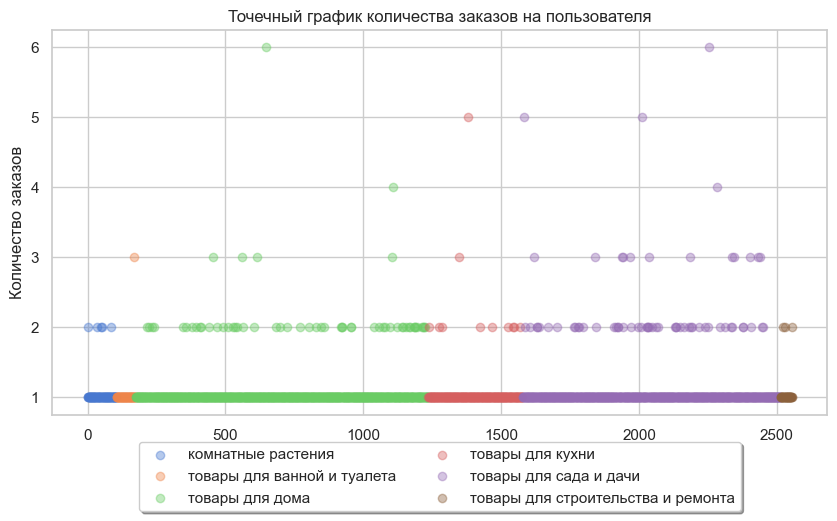

In [53]:
#построим точечную диаграмму заказов на пользователя
fig, ax = plt.subplots(figsize=(10,5))
ax.set(title='Точечный график количества заказов на пользователя', xlabel='Порядковый номер пользователя', ylabel='Количество заказов')
for cat in orders_by_users['category'].unique():
    data_filtered = orders_by_users.query('category == @cat')
    ax.scatter(data_filtered.index, data_filtered['orders'], alpha = 0.4, label=cat)
#ax.legend(bbox_to_anchor=(1, 1))
# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2)
#ax.grid()
plt.show()

In [54]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
order_id,4563.0,46958.975455,27618.287577,12624.0,14764.0,68822.0,70871.0,73164.0
quantity,4563.0,1.905325,3.185865,1.0,1.0,1.0,1.0,30.0
price,4563.0,504.596757,942.394209,9.0,90.0,150.0,487.0,14917.0
revenue,4563.0,640.458470,1339.910484,9.0,120.0,188.0,674.0,47385.0


<div style="border:solid black 1px; padding: 20 px">
В основном в каждой категории пользователи совершают 1 заказ (медиана и третий квартиль равны 1), есть пользователи с 2 заказами, но 3 и более встречаются крайне редко.
</div>

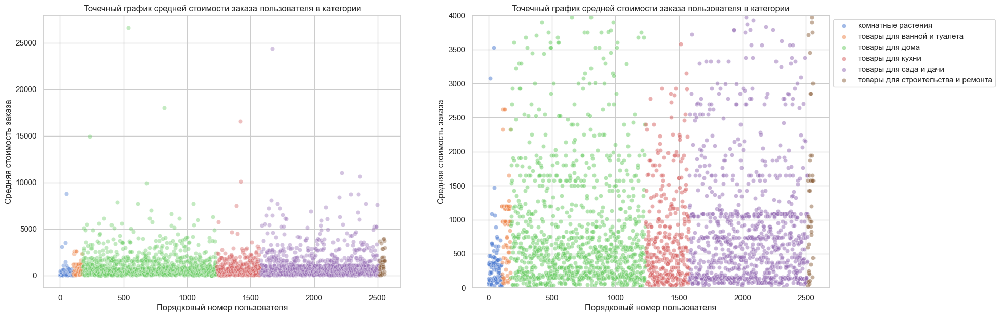

In [55]:
#построим точечную диаграмму заказов на пользователя
figure, ax = plt.subplots(1,2,figsize=(20,7))
for cat in orders_by_users['category'].unique():
    data_filtered = orders_by_users.query('category == @cat')
    ax[0].set(title='Точечный график средней стоимости заказа пользователя в категории', xlabel='Порядковый номер пользователя', ylabel='Средняя стоимость заказа')
    sn.scatterplot(data_filtered.index, data_filtered['avg_revenue'], alpha = 0.4,ax=ax[0])
    ax[1].set(title='Точечный график средней стоимости заказа пользователя в категории', xlabel='Порядковый номер пользователя', ylabel='Средняя стоимость заказа')
    sn.scatterplot(data_filtered.index, data_filtered['avg_revenue'], alpha = 0.5, label=cat, ax=ax[1])
    plt.ylim(0,4000)
    plt.legend(bbox_to_anchor=(1, 1))
plt.show()

<div style="border:solid black 1px; padding: 20 px">
Заметно, что товары для дома имеют наибольшее количество "выбросов" - пользователи с высоким средним чеком. Крупные заказы присутсвуют и в категории "товары для сада и дачи" и "товары для кухни".
</div>

In [56]:
#выделим месяц
data['round_month'] = data['date'].astype('datetime64[M]')
data.round_month.unique()

array(['2018-10-01T00:00:00.000000000', '2018-11-01T00:00:00.000000000',
       '2018-12-01T00:00:00.000000000', '2019-01-01T00:00:00.000000000',
       '2019-02-01T00:00:00.000000000', '2019-03-01T00:00:00.000000000',
       '2019-04-01T00:00:00.000000000', '2019-05-01T00:00:00.000000000',
       '2019-06-01T00:00:00.000000000', '2019-07-01T00:00:00.000000000',
       '2019-08-01T00:00:00.000000000', '2019-09-01T00:00:00.000000000',
       '2019-10-01T00:00:00.000000000'], dtype='datetime64[ns]')

In [57]:
revenue_by_month = data.groupby(by=['round_month','category'],as_index=False).agg({'order_id':'nunique','customer_id':'nunique','revenue':'sum'})
#переименуем столбцы
revenue_by_month.columns = ['round_month','category','orders','customers','revenue']
revenue_by_month

,round_month,category,orders,customers,revenue
0,2018-10-01,комнатные растения,9,9,4066.0
1,2018-10-01,товары для ванной и туалета,7,7,4763.0
2,2018-10-01,товары для дома,96,94,122651.0
3,2018-10-01,товары для кухни,38,37,38345.0
4,2018-10-01,товары для сада и дачи,63,61,69121.0
5,2018-10-01,товары для строительства и ремонта,6,6,6239.0
6,2018-11-01,комнатные растения,5,5,2071.0
7,2018-11-01,товары для ванной и туалета,12,10,6753.0
8,2018-11-01,товары для дома,104,102,128064.0
9,2018-11-01,товары для кухни,32,32,33325.0


In [58]:
#создаем датафрейм dates_groups с уникальными парами значений 'date' и 'category' таблицы revenue_by_month
dates_groups = revenue_by_month[['round_month', 'category']].drop_duplicates()

In [59]:
#соберём агрегированные кумулятивные по месяцам
orders_aggregated = dates_groups.apply(
    lambda x: revenue_by_month[
        np.logical_and(
            revenue_by_month['round_month'] <= x['round_month'], revenue_by_month['category'] == x['category']
        )
    ].agg(
        {
            'round_month': 'max',
            'category': 'max',
            'orders': 'sum',
            'customers': 'sum',
            'revenue': 'sum',
        }
    ),
    axis=1,
).sort_values(by=['round_month', 'category'])
orders_aggregated

,round_month,category,orders,customers,revenue
0,2018-10-01,комнатные растения,9,9,4066.0
1,2018-10-01,товары для ванной и туалета,7,7,4763.0
2,2018-10-01,товары для дома,96,94,122651.0
3,2018-10-01,товары для кухни,38,37,38345.0
4,2018-10-01,товары для сада и дачи,63,61,69121.0
5,2018-10-01,товары для строительства и ремонта,6,6,6239.0
6,2018-11-01,комнатные растения,14,14,6137.0
7,2018-11-01,товары для ванной и туалета,19,17,11516.0
8,2018-11-01,товары для дома,200,196,250715.0
9,2018-11-01,товары для кухни,70,69,71670.0


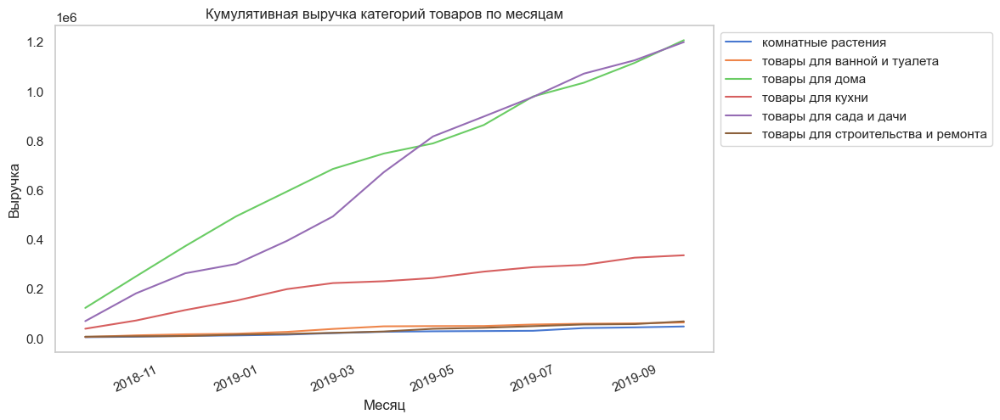

In [60]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=orders_aggregated,x='round_month', y='revenue', hue='category')
plt.legend()
plt.title('Кумулятивная выручка категорий товаров по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Выручка')
plt.xticks(rotation = 25)
plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

<div style="border:solid black 1px; padding: 20 px">
Как уже было видно ранее, наибольшее количество выручки принесли для магазина "товары для дома" и "товары для сада и дачи" - по 1.2 млн.руб за весь рассматриваемый период. Топ-3 закрывают "товары для кухни" - 0.2 млн. руб.
</div>

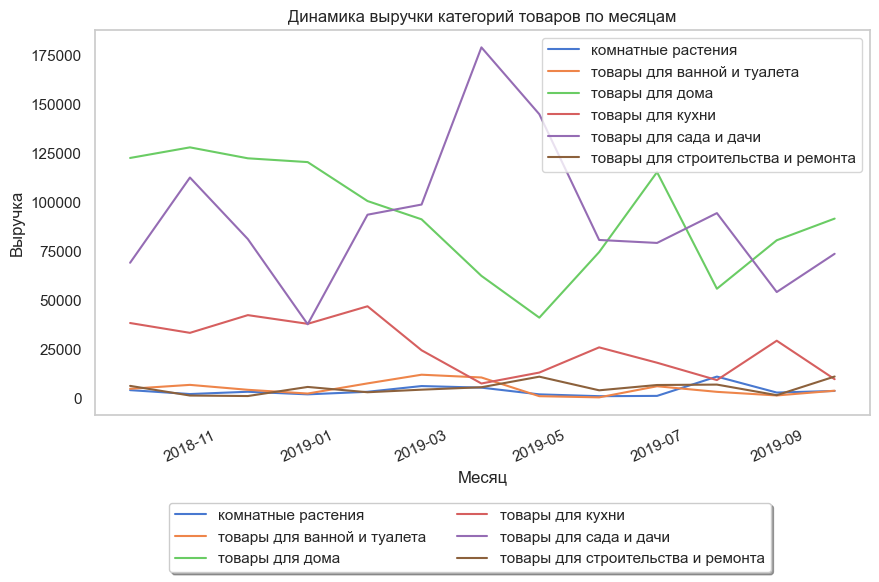

In [61]:
#строим графики
ax = plt.figure(figsize=(10,5))
sn.lineplot(data=revenue_by_month,x='round_month', y='revenue', hue='category')
plt.legend()
plt.title('Динамика выручки категорий товаров по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Выручка')
plt.xticks(rotation = 25)
# Put a legend below current axis
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=2)
#plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

In [62]:
total_revenue_by_month = data.groupby(by='round_month',as_index=False).agg({'order_id':'nunique','customer_id':'nunique','revenue':'sum'})
#переименуем столбцы
total_revenue_by_month.columns = ['round_month','orders','customers','revenue']
total_revenue_by_month

,round_month,orders,customers,revenue
0,2018-10-01,178,173,245185.0
1,2018-11-01,181,174,284181.0
2,2018-12-01,228,220,254585.0
3,2019-01-01,159,148,206115.0
4,2019-02-01,256,241,254930.0
5,2019-03-01,230,222,236988.0
6,2019-04-01,259,233,270446.0
7,2019-05-01,174,160,212946.0
8,2019-06-01,156,147,186587.0
9,2019-07-01,197,185,226600.0


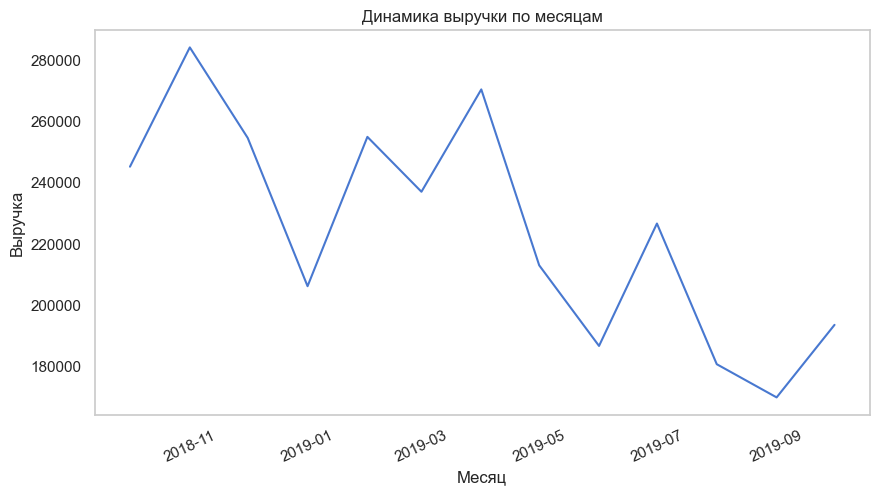

In [63]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=total_revenue_by_month,x='round_month', y='revenue')
#plt.legend()
plt.title('Динамика выручки по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Выручка')
plt.xticks(rotation = 25)
#plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

<div style="border:solid black 1px; padding: 20 px">
По графику можно сделать вывод, что товары для сада и дачи приносят наибольшее количество выручки с апреля по май, как раз когда начинается дачный сезон. Товары для дома пользуются больше популряностью в зимнее время года, в целом то же самое можно и сказать про товары для кухни. Остальные категории товаров меньше подвержены сезонности и приносят в среднем постоянную выручку по месяцам.
    
Заметен общий тренд на снижение суммарной выручки магазина на 20% (октября 2018 - октябрь 2019).
</div>

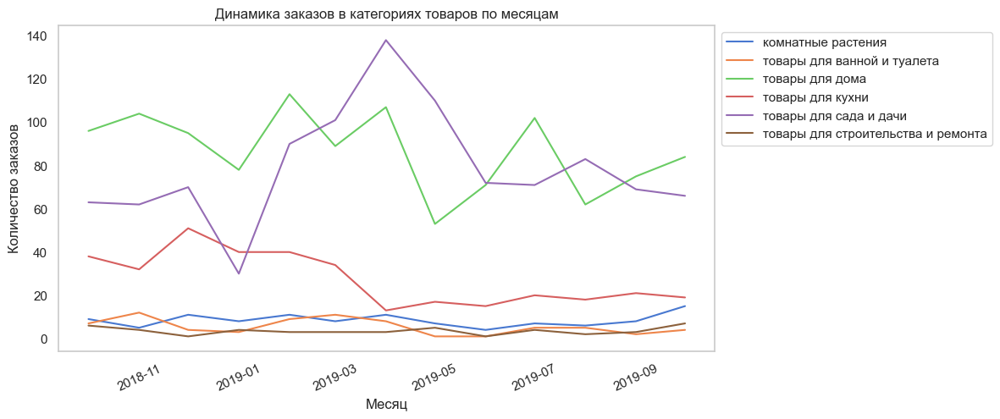

In [64]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=revenue_by_month,x='round_month', y='orders', hue='category')
plt.legend()
plt.title('Динамика заказов в категориях товаров по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Количество заказов')
plt.xticks(rotation = 25)
plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

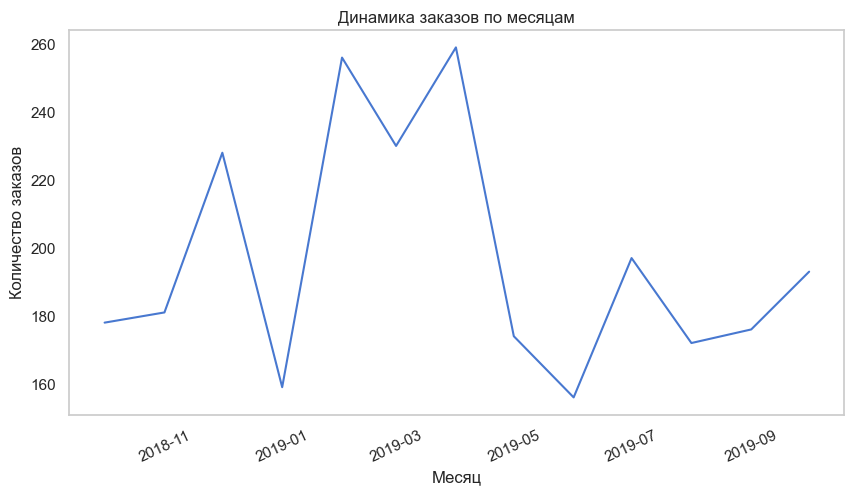

In [65]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=total_revenue_by_month,x='round_month', y='orders')
#plt.legend()
plt.title('Динамика заказов по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Количество заказов')
plt.xticks(rotation = 25)
#plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

<div style="border:solid black 1px; padding: 20 px">
Опять же заметно, что пик количества заказов в категории "товары для сада и дачи" приходится на  апрель-май. В среднем количество заказов в категориях "товары для дома" и"товары для кухни" выше в месяцы октябрь-ферваль. По остальным категориям количество заказов постоянно находится примерно в одном диапазоне.
    
Максимальное количество заказов наблюдается в период с февраля по апрель 2019 (примерно 250 заказов каждый месяц).
</div>

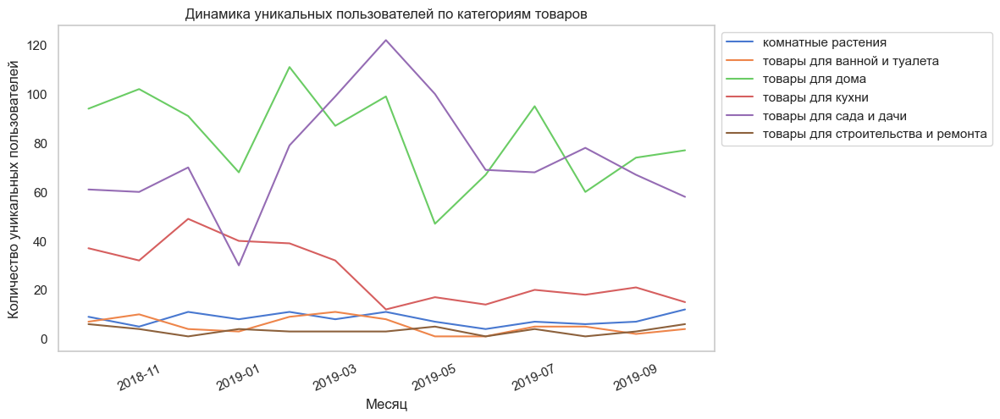

In [66]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=revenue_by_month,x='round_month', y='customers', hue='category')
plt.legend()
plt.title('Динамика уникальных пользователей по категориям товаров')
plt.xlabel('Месяц')
plt.ylabel('Количество уникальных пользователей')
plt.xticks(rotation = 25)
plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

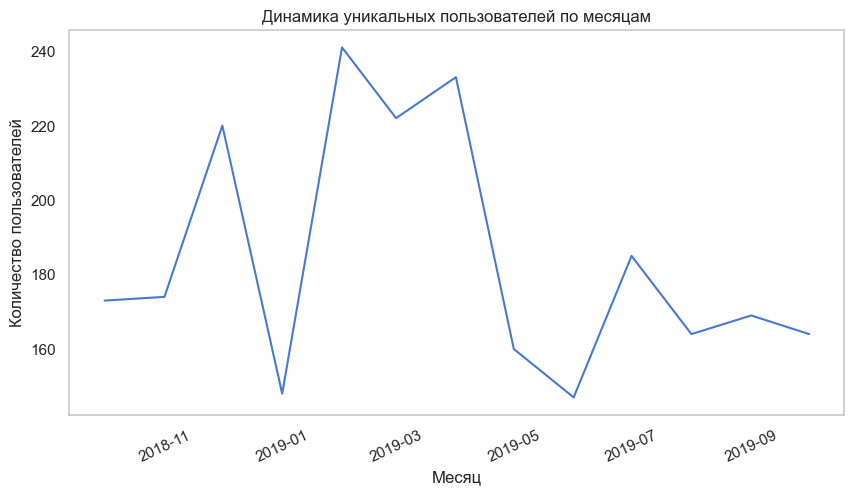

In [67]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=total_revenue_by_month,x='round_month', y='customers')
#plt.legend()
plt.title('Динамика уникальных пользователей по месяцам')
plt.xlabel('Месяц')
plt.ylabel('Количество пользователей')
plt.xticks(rotation = 25)
#plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

<div style="border:solid black 1px; padding: 20 px">
Динамика уникальных пользователей по месяцам также подтверждает сказанные выше предположения о сезонности товаров.
    
Пик количества уникальных пользователей, как и пик количества заказов, приходится на февраль-апрель 2019. Количество пользователей каждвй месяц не опускается ниже 160.
</div>

In [68]:
#посчитаем средний чек пользователя в каждой категории товаров
data_by_users = data.groupby(by=['category','customer_id','round_month'],as_index=False).agg({'order_id':'nunique','revenue':'sum'})
#переименуем столбцы
data_by_users.columns = ['category','customer_id','round_month','orders','revenue']
data_by_users['avg_revenue'] = data_by_users['revenue']/data_by_users['orders']
data_by_users

,category,customer_id,round_month,orders,revenue,avg_revenue
0,комнатные растения,0758367d-cf0e-4e20-b64d-8aaa643f42df,2019-09-01,1,52.0,52.000000
1,комнатные растения,0946f283-946c-4fc9-b7b0-9c9f73f87acd,2018-12-01,1,134.0,134.000000
2,комнатные растения,0a8362cf-e2d8-4ffc-8072-33239f5e450a,2018-10-01,1,350.0,350.000000
3,комнатные растения,0adba506-249c-40b5-839d-a59d7a275cd7,2019-10-01,2,148.0,74.000000
4,комнатные растения,0d63e933-a9e7-4286-885e-f114b0ab43c2,2019-08-01,1,472.0,472.000000
5,комнатные растения,0d7bd2fb-a17c-4532-a50e-92b92ebd7240,2019-04-01,1,374.0,374.000000
6,комнатные растения,10b8dc5a-0332-4286-8e80-97f197cbc84e,2019-01-01,1,112.0,112.000000
7,комнатные растения,1b29b7f1-5700-4deb-820c-6787d96176f0,2019-07-01,1,119.0,119.000000
8,комнатные растения,1f2aff94-ac51-478d-bb4e-f678d08eb182,2019-09-01,1,112.0,112.000000
9,комнатные растения,223c92c6-a951-4307-a8c3-19bdc455eb79,2019-02-01,1,209.0,209.000000


In [69]:
#средний чек по всем пользователям в каждой категории товаров
avg_revenue_by_month = data_by_users.groupby(by=['category','round_month'],as_index=False).agg({'avg_revenue':'mean'})
avg_revenue_by_month

,category,round_month,avg_revenue
0,комнатные растения,2018-10-01,451.777778
1,комнатные растения,2018-11-01,414.200000
2,комнатные растения,2018-12-01,293.909091
3,комнатные растения,2019-01-01,238.875000
4,комнатные растения,2019-02-01,293.000000
5,комнатные растения,2019-03-01,768.750000
6,комнатные растения,2019-04-01,485.545455
7,комнатные растения,2019-05-01,272.000000
8,комнатные растения,2019-06-01,243.000000
9,комнатные растения,2019-07-01,161.000000


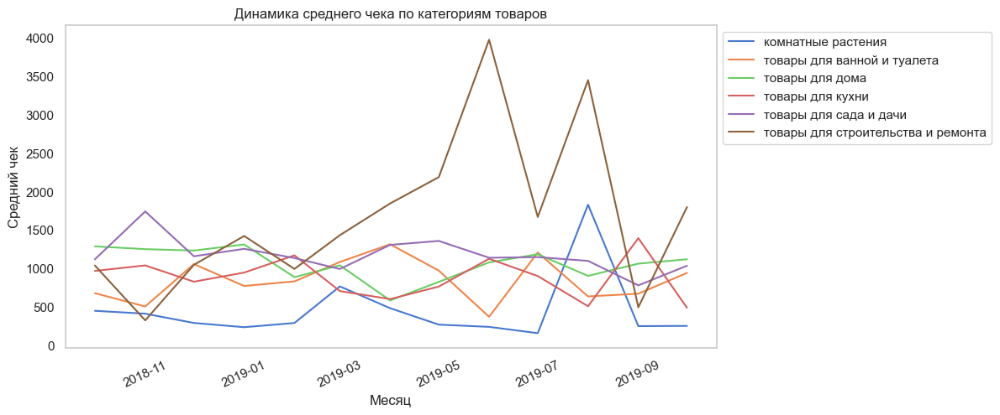

In [70]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=avg_revenue_by_month,x='round_month', y='avg_revenue', hue='category')
plt.legend()
plt.title('Динамика среднего чека по категориям товаров')
plt.xlabel('Месяц')
plt.ylabel('Средний чек')
plt.xticks(rotation = 25)
plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

In [71]:
#средний чек по всем пользователям 
all_users_by_month = data_by_users.groupby(by='round_month',as_index=False).agg({'avg_revenue':'mean'})
all_users_by_month

,round_month,avg_revenue
0,2018-10-01,1123.962617
1,2018-11-01,1287.219092
2,2018-12-01,1074.086283
3,2019-01-01,1143.141612
4,2019-02-01,984.115079
5,2019-03-01,976.010417
6,2019-04-01,965.992810
7,2019-05-01,1139.592279
8,2019-06-01,1104.266026
9,2019-07-01,1119.653266


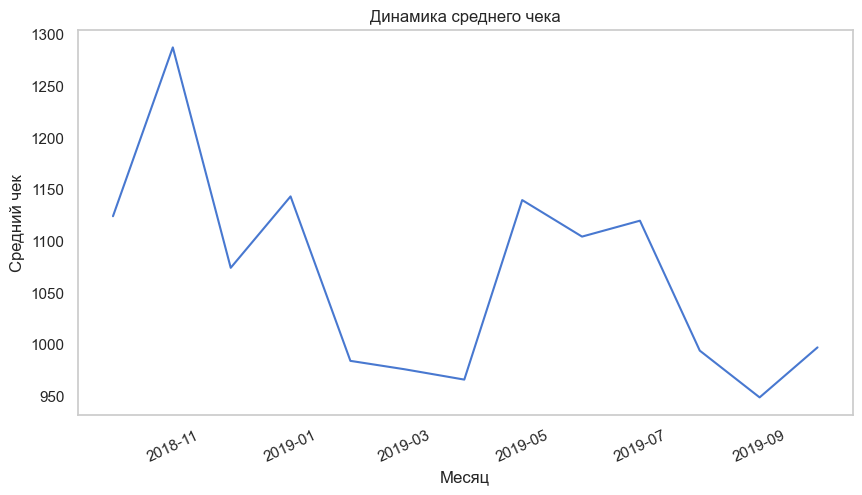

In [72]:
#строим графики
plt.figure(figsize=(10,5))
sn.lineplot(data=all_users_by_month,x='round_month', y='avg_revenue')
#plt.legend()
plt.title('Динамика среднего чека')
plt.xlabel('Месяц')
plt.ylabel('Средний чек')
plt.xticks(rotation = 25)
#plt.legend(bbox_to_anchor=(1, 1))
plt.grid()

In [73]:
#проверим пики товаров для строительства и ремонта
data.query('customer_id=="e3687048-7d49-4e68-bb2c-4b7a3acbec63" and category=="товары для строительства и ремонта"')

,date,customer_id,order_id,product,quantity,price,category,revenue,round_month
5410,2019-06-17 09:00:00,e3687048-7d49-4e68-bb2c-4b7a3acbec63,71724,Стремянки Colombo Leonardo 3 ступени G300A03W ...,1,3974.0,товары для строительства и ремонта,3974.0,2019-06-01


In [74]:
#проверим пики товаров для строительства и ремонта
data.query('customer_id=="540072bd-cc85-43b5-a6d6-0a8720499e65" and category=="товары для строительства и ремонта"')

,date,customer_id,order_id,product,quantity,price,category,revenue,round_month
6128,2019-08-18 10:00:00,540072bd-cc85-43b5-a6d6-0a8720499e65,72329,Стремянка COLOMBO FACTOTUM 4 ступени алюминий ...,1,3449.0,товары для строительства и ремонта,3449.0,2019-08-01
6129,2019-08-18 10:00:00,540072bd-cc85-43b5-a6d6-0a8720499e65,72330,Стремянка COLOMBO FACTOTUM 4 ступени алюминий ...,1,3449.0,товары для строительства и ремонта,3449.0,2019-08-01


<div style="border:solid black 1px; padding: 20 px">
Наибольший средний чек имеют следующие категории товаров: товары для сада и дачи, товары для дома и товары для кухни. Заметны большие пики для категории "товары для строительства и ремонта" в июне и августе, что обусловлено крупными покупками (стремянки COLOMBO двумя пользователями), поэтому нельзя утержать, что средний чек для этой категории будет самым высоким. Товары для кухни, товары для для ванной и туалета и комнатные растения также имеют пики (но не такие ярковыраженные), вероятно, также из-за крупных заказов отдельных пользователей.
</div>

<div style="border:solid green 2px; padding: 20 px">

Период анализа с 01-10-2018 по 31-10-2019.
В этот промежуток было задействовано 2355 уникальных пользователей, совершено 2229 уникальных заказа. Всего в датафрейме после очистки осталось 2553 уникальных товаров в каталоге.
    
В результате исследовательского анализа выяснили:

- Наибольшее количество уникальных товаров имеется в категории "товары для сада и дачи" - 947, на втором и третьем месте "товары для дома" - 753 и "товары для кухни" - 342. Остальные категории товаров имеют меньше 100 уникальных позиций.
   
- Наибольшую выручку принесли следующие категории: "товары для дома" - 41%, "товары для сада и дачи" - 41%, "товары для кухни" - 11%. Оставшиеся категории принесли в среднем по 2%.
    
- В каждой категории в среднем на пользователя приходится 1 заказ.
    
- Крупные заказы присутсвуют в категориях "товары для дома", "товары для сада и дачи" и "товары для кухни".
    
- За весь временной период "товары для дома" принесли выручку около 1.2 млн, "товары для сада и дачи" около 1.2 млн., а "товары для кухни" - 200 тыс. Оставшиеся категории принесли выручку меньше 100 тыс.
    
- По графикам динамики было выявлено, что тип продажи товаров для сада и дачи приходится с апреля по май, в то время как "товары для дома"  и "товары для кухни" пользуются большей популярностью в зимний период времени. Остальные категории меньше подвержены сезонности и приносят в среднем постоянную выручку в каждый месяц.
    
- Наибольший средний чек имеют следующие категории товаров: товары для сада и дачи, товары для дома и товары для кухни. Заметны большие пики для категории "товары для строительства и ремонта" в июне и августе, что обусловлено крупными покупками (стремянки COLOMBO двумя пользователями).
    
- Заметен общий тренд на снижение суммарной выручки магазина на 20% (октября 2018 - октябрь 2019).
    
- Максимальное количество заказов наблюдается в период с февраля по апрель 2019 (примерно 250 заказов каждый месяц).
    
- Пик количества уникальных пользователей, как и пик количества заказов, приходится на февраль-апрель 2019. КОличество пользователей каждый месяц не опускается ниже 160.

- Общий тренд среднего чека: макимальный средний чек в ноябре, монотонное снижение до февраля, сильная просадка с февраля по апрель, рост с апреля по июнь, и опять снижение к сентябрю. Средний чек в октябре 2018 выше на 10% среднего чека в октябре 2019 (количество заказов осталось примерно на одном уровне, а вот позиции товаров, которые заказывают пользователи, видимо стали дешевле).

## RFM анализ

In [75]:
#транзакции совершались в период
print('Продажи с {} по {}'.format(data['date'].min(),
                                    data['date'].max()))

Продажи с 2018-10-01 00:00:00 по 2019-10-31 16:00:00


In [76]:
#примем за момент анализа максимальную дату продаж + 1 день
NOW = data['date'].max() + timedelta(days=1)
NOW

Timestamp('2019-11-01 16:00:00')

In [77]:
#добавим столбец, 'days_since_last_purchase', с количеством дней между покупкой и  принятым моментом анализа - Recently
data['days_since_purchase'] = data['date'].apply(lambda x:(NOW - x).days)
data

,date,customer_id,order_id,product,quantity,price,category,revenue,round_month,days_since_purchase
0,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Алое Вера, d12, h30",1,142.0,товары для сада и дачи,142.0,2018-10-01,396
1,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,"Комнатное растение в горшке Кофе Арабика, d12,...",1,194.0,товары для сада и дачи,194.0,2018-10-01,396
2,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Радермахера d-12 см h-20 см,1,112.0,комнатные растения,112.0,2018-10-01,396
3,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Хризолидокарпус Лутесценс d-9 см,1,179.0,комнатные растения,179.0,2018-10-01,396
4,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Циперус Зумула d-12 см h-25 см,1,112.0,комнатные растения,112.0,2018-10-01,396
5,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Шеффлера Лузеана d-9 см,1,164.0,комнатные растения,164.0,2018-10-01,396
6,2018-10-01 00:00:00,ee47d746-6d2f-4d3c-9622-c31412542920,68477,Юкка нитчатая d-12 см h-25-35 см,1,134.0,комнатные растения,134.0,2018-10-01,396
7,2018-10-01 08:00:00,375e0724-f033-4c76-b579-84969cf38ee2,68479,Настенная сушилка для белья Gimi Brio Super 100,1,824.0,товары для дома,824.0,2018-10-01,396
8,2018-10-01 08:00:00,6644e5b4-9934-4863-9778-aaa125207701,68478,"Таз пластмассовый 21,0 л круглый ""Водолей"" С61...",1,269.0,товары для дома,269.0,2018-10-01,396
10,2018-10-01 11:00:00,161e1b98-45ba-4b4e-8236-e6e3e70f6f7c,68483,Вешалка для брюк металлическая с резиновым пок...,10,82.0,товары для дома,820.0,2018-10-01,396


In [78]:
#будем искать лояльных покупателей 
#Recency будет минимальное количество 'days_since_last_purchase' для каждого покупателя 
#Frequency полное количество уникальных заказов для  покупателя 
#Monetary общая сумма покупок клиента за все время
aggr = {
    'days_since_purchase': lambda x:x.min(),
    'order_id': lambda x: x.nunique(),
    'revenue' : lambda x: x.sum()
        }
aggr

{'days_since_purchase': <function __main__.<lambda>(x)>,
 'order_id': <function __main__.<lambda>(x)>,
 'revenue': <function __main__.<lambda>(x)>}

In [79]:
#подготовим данные для rfm анализа
rfm = data.groupby('customer_id').agg(aggr).reset_index()
rfm.rename(columns={'days_since_purchase': 'recency',
                   'order_id': 'frequency',
                   'revenue':'monetary'},
          inplace=True)

In [80]:
rfm.sort_values('monetary', ascending=False)

,customer_id,recency,frequency,monetary
804,58a4c3cc-504f-43ea-a74a-bae19e665552,290,2,53232.0
257,1b2764ad-9151-4051-a46a-9b01b62e6335,360,1,24370.0
1442,9f1e7d7d-ff10-4eb1-b596-1cbf8075aa3f,367,1,22056.0
1052,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,1,17,21361.0
1337,940c175f-ea87-44e0-9e16-0a3d0a9abecd,142,2,20232.0
1310,909564b8-3a5c-4d3e-8310-5ba1c837bbd7,270,1,16536.0
127,0d87f4ae-465a-4fac-81e6-5d629761783e,94,1,14917.0
899,639c4989-b0ab-412a-b7ec-be394cb2d372,360,3,12095.0
1213,86c97bf1-c834-423e-9e38-8acda68f97e8,318,2,11548.0
1513,a9089b7e-e6a5-48f9-9b76-48693b63a092,168,3,11495.0


- Считаем R, F and M баллы

In [81]:
#присваиваем рейтинг от 1 до 3 в зависимости от recency, monetary and frequency 
#используем метод деления на квантили, в результате выборка будет поделена на три равные части

quintiles = rfm[['recency', 'frequency', 'monetary']].quantile([.33, .66, .99]).to_dict()
quintiles

{'recency': {0.33: 148.0, 0.66: 260.6400000000001, 0.99: 393.0},
 'frequency': {0.33: 1.0, 0.66: 1.0, 0.99: 3.0},
 'monetary': {0.33: 429.6400000000001, 0.66: 1087.0, 0.99: 7698.780000000002}}

In [82]:
quintiles_2 = rfm[['frequency']].quantile([0.5]).to_dict()
quintiles_2

{'frequency': {0.5: 1.0}}

In [83]:
#присваиваем рейтинг от 1 до 3 (frequency от 1 до 2)
#высокие значения лучше для frequency and monetary, в то время как низкие значения лучше для recency

#функция для ранжирования recency
def r_score(x):
    if x <= quintiles['recency'][.33]:
        return 3
    elif x <= quintiles['recency'][.66]:
        return 2
    else:
        return 1

In [84]:
#функция для ранжирования monetary
def fm_score(x, c):
    if x <= quintiles[c][.33]:
        return 1
    elif x <= quintiles[c][.66]:
        return 2
    else:
        return 3

In [85]:
#функция для ранжирования frequency
def f_score(x, c):
    if x <= quintiles_2[c][.5]:
        return 1
    else:
        return 2

In [86]:
#проставляем R, F and M оценки для каждого покупателя
rfm['r'] = rfm['recency'].apply(lambda x: r_score(x))
rfm['f'] = rfm['frequency'].apply(lambda x: f_score(x, 'frequency'))
rfm['m'] = rfm['monetary'].apply(lambda x: fm_score(x, 'monetary'))

In [87]:
rfm.head()

,customer_id,recency,frequency,monetary,r,f,m
0,000d6849-084e-4d9f-ac03-37174eaf60c4,16,1,555.0,3,1,2
1,001cee7f-0b29-4716-b202-0042213ab038,258,1,442.0,2,1,2
2,00299f34-5385-4d13-9aea-c80b81658e1b,17,1,914.0,3,1,2
3,002d4d3a-4a59-406b-86ec-c3314357e498,277,1,1649.0,1,1,3
4,003bbd39-0000-41ff-b7f9-2ddaec152037,32,1,2324.0,3,1,3


In [88]:
#комбинируем R, F and M, чтобы создать уникальную RFM оценку

rfm['rfm_score'] = rfm['r'].map(str) + rfm['f'].map(str) + rfm['m'].map(str)
rfm.head()

,customer_id,recency,frequency,monetary,r,f,m,rfm_score
0,000d6849-084e-4d9f-ac03-37174eaf60c4,16,1,555.0,3,1,2,312
1,001cee7f-0b29-4716-b202-0042213ab038,258,1,442.0,2,1,2,212
2,00299f34-5385-4d13-9aea-c80b81658e1b,17,1,914.0,3,1,2,312
3,002d4d3a-4a59-406b-86ec-c3314357e498,277,1,1649.0,1,1,3,113
4,003bbd39-0000-41ff-b7f9-2ddaec152037,32,1,2324.0,3,1,3,313


In [89]:
rfm['fm'] = ((rfm['f'] + rfm['m'])/2).apply(lambda x: math.ceil(x))

In [90]:
rfm.head()

,customer_id,recency,frequency,monetary,r,f,m,rfm_score,fm
0,000d6849-084e-4d9f-ac03-37174eaf60c4,16,1,555.0,3,1,2,312,2
1,001cee7f-0b29-4716-b202-0042213ab038,258,1,442.0,2,1,2,212,2
2,00299f34-5385-4d13-9aea-c80b81658e1b,17,1,914.0,3,1,2,312,2
3,002d4d3a-4a59-406b-86ec-c3314357e498,277,1,1649.0,1,1,3,113,2
4,003bbd39-0000-41ff-b7f9-2ddaec152037,32,1,2324.0,3,1,3,313,2


In [91]:
rfm['fm'].unique()

array([2, 1, 3])

In [92]:
# создали только 7 сегментов, основанные на двух оценках: 'r' and 'fm'

segment_map = {
    #r'22': 'hibernating',
    r'11': 'lost',
    r'13': 'can\'t lose',
    r'[1-2][2-3]': 'at risk',
    r'2[1-2]': 'about to sleep',
    r'33': 'loyal customers',
    r'31': 'new customers',
    r'32': 'potential loyalists'
}

rfm['segment'] = rfm['r'].map(str) + rfm['fm'].map(str)
rfm['segment'] = rfm['segment'].replace(segment_map, regex=True)
rfm.head(10)

,customer_id,recency,frequency,monetary,r,f,m,rfm_score,fm,segment
0,000d6849-084e-4d9f-ac03-37174eaf60c4,16,1,555.0,3,1,2,312,2,potential loyalists
1,001cee7f-0b29-4716-b202-0042213ab038,258,1,442.0,2,1,2,212,2,at risk
2,00299f34-5385-4d13-9aea-c80b81658e1b,17,1,914.0,3,1,2,312,2,potential loyalists
3,002d4d3a-4a59-406b-86ec-c3314357e498,277,1,1649.0,1,1,3,113,2,at risk
4,003bbd39-0000-41ff-b7f9-2ddaec152037,32,1,2324.0,3,1,3,313,2,potential loyalists
5,004d24e9-4a6c-4d0e-8727-8391dfd4b43a,278,1,1536.0,1,1,3,113,2,at risk
6,005ba170-45e8-42de-93f7-192481ae2659,366,1,1199.0,1,1,3,113,2,at risk
7,00bd74b1-2792-47db-a2f1-680a09ac5026,376,1,937.0,1,1,2,112,2,at risk
8,00c0f92a-121a-4883-a78d-2c7b5fe187de,251,1,134.0,2,1,1,211,1,about to sleep
9,00cd704a-a65c-4865-b39a-779f1b4f1d1a,253,1,112.0,2,1,1,211,1,about to sleep


In [93]:
rfm[['r', 'fm', 'segment']].sort_values(by=['r', 'fm'])

,r,fm,segment
53,1,1,lost
61,1,1,lost
63,1,1,lost
68,1,1,lost
82,1,1,lost
88,1,1,lost
98,1,1,lost
100,1,1,lost
131,1,1,lost
133,1,1,lost


<div style="border:solid green 2px; padding: 20 px">
    
В ходе анализа пользователи были поделены на 3 равные части по признакам: `recency` - давность покупки,  и `monetary` - общая сумма покупок пользователя, по `frequency` - частота покупки - на две части. В зависимости от того, в какую часть попал пользователь, по каждому признаку ему был присвоен балл от 1 до 3 (от 1 до 2 для frequency ). Причем для `frequency` и `monetary` чем выше значение, тем выше балл, а для `recency` зависимость обратная. В результате получили 18 сегментов, что довольно много для дальнейшего исследования. Сегменты укрупнили путем комбинации f and m, округляя результат их среднего значения (fm = (f+m)/2) вверх.
    
Таким образом, в результате RFM анализа пользователи в каждой категории товаров были поделены на 7 сегментов, исходя их давности, частоты и общей стоимости покупок. Описание сегментов представлено ниже.
    
</div>

<div style="border:solid green 2px; padding: 20 px">
    
### **Описание сегментов**

**Loyal Customers** Покупают на регулярной основе. Отзывчивы к рекламным акциям.

**Potential Loyalists** Недавние покупатели, со средней частотой покупок.

**New customers (Recent Customers)** Покупали совсем недавно, но не часто.

**About To Sleep** Давность и частота покупок ниже среднего. Вы потеряете их, если не активируете повторно.

**At Risk** Покупали часто (на регулярной основе), но давно. Нужно вернуть их обратно!

**Can’t Lose** Они часто покупали, но долгое время не возвращались.

**Lost** Последняя покупка была давно и они не вернулись.

## Изучение сегментов 

In [94]:
#проверим какие категории присуствуют в датафрейме
rfm['segment'].unique()

array(['potential loyalists', 'at risk', 'about to sleep',
       'new customers', "can't lose", 'lost', 'loyal customers'],
      dtype=object)

In [95]:
#добавим столбец c названием сегмента для каждого покупателя, присоединив в дф data дф rfm
data_segment = data.merge(rfm[['customer_id','segment']], how='left', on='customer_id')
data_segment.sample(5)

,date,customer_id,order_id,product,quantity,price,category,revenue,round_month,days_since_purchase,segment
4397,2019-10-07 11:00:00,0b09525a-e826-4d5f-9042-58999e1057ec,72884,Стремянки Colombo Leonardo 2 ступени G300A02W ...,1,3712.0,товары для строительства и ремонта,3712.0,2019-10-01,25,potential loyalists
2800,2019-05-12 19:00:00,cdd08c5f-5b8c-4abf-8bdf-ed6dcffabff9,14754,"Вербена Fuhcsia ярко-розовая объем 0,5 л",1,90.0,товары для сада и дачи,90.0,2019-05-01,172,at risk
3008,2019-05-15 11:00:00,0a7aaf8d-f5c1-4a8b-bdcd-1fe382446f3c,71432,Чехол для одежды Hausmann со стенкой из ПВХ и ...,1,232.0,товары для дома,232.0,2019-05-01,170,about to sleep
1574,2019-03-01 13:00:00,1ad78811-b8b9-4607-9e9b-9b105927534e,14554,Пеларгония Toscana Angeleyes Amarillo Burgundy...,1,112.0,товары для сада и дачи,112.0,2019-03-01,245,at risk
1761,2019-03-14 21:00:00,85c6cfd5-3f09-42df-85e3-0a94e8b30420,70741,Роза мини желтая d-7 см h-10,1,187.0,товары для сада и дачи,187.0,2019-03-01,231,about to sleep


In [96]:
#количество пользователей в каждом сегменте
customers_by_segment = data_segment.groupby('segment', as_index=False).agg({'customer_id':'nunique'}).sort_values('customer_id')
customers_by_segment

,segment,customer_id
2,can't lose,17
4,loyal customers,32
3,lost,223
0,about to sleep,247
5,new customers,278
6,potential loyalists,470
1,at risk,1088


In [97]:
#график 
fig = px.bar(customers_by_segment, x='customer_id', y='segment', text='customer_id', title='Количество пользователей по сегментам')
fig.update_layout(xaxis_title = 'Количество пользователей', yaxis_title = 'Сегмент')
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Наибольшее количество пользователей имеется в сегменте "at risk" - 1088, это пользователи которые покупали часто и на постоянной основе, но давно. Лояльных покупателей всего 32, а вот потенциально лояльных (недавние покупатели со средней частотой покупок) - 470. Новых покупателей - 278. Потерянных клиентов - 223. Покупателей, которые находятся в спящем режиме (частота и давность ниже среднего) - 247. И 17 клиентов попали в сегмент "Can’t Lose", покупали часто, но очень давно.
</div>

In [98]:
#количество заказов в каждом сегменте
orders_by_segment = data_segment.groupby('segment', as_index=False).agg({'order_id':'nunique'}).sort_values('order_id')
orders_by_segment

,segment,order_id
2,can't lose,37
4,loyal customers,86
3,lost,223
0,about to sleep,247
5,new customers,278
6,potential loyalists,497
1,at risk,1185


In [99]:
#график 
fig = px.bar(orders_by_segment, x='order_id', y='segment', text='order_id', title='Количество заказов по сегментам')
fig.update_layout(xaxis_title = 'Количество заказов', yaxis_title = 'Сегмент')
fig.show()

<div style="border:solid black 1px; padding: 20 px">
    
Больше всего заказов совершено в категории "at risk" - 1185, что вполне логично, ведь она лидер по количеству пользователей. Лояльные покупатели совершили 86 заказов, что в 2,6 раз больше количества пользователей в данном сегменте, аналогично и для сегмента "Can’t Lose" - 37 заказов (17 пользователей).  Потерянные пользователи и пользователи, переходящие в спящий режим, совершили ровно по одному заказу - 223 и 247. Новые покупали и потенциально лояльные по 278 и 497 заказов соответственно.
</div>

In [100]:
#средний чек пользователя в сегменте
data_by_customers = data_segment.groupby(['segment','customer_id'], as_index=False).agg({'order_id':'nunique','revenue':'sum'})
data_by_customers.columns = ['segment','customer_id','orders','revenue']
data_by_customers['avg_revenue'] = data_by_customers['revenue']/data_by_customers['orders']
data_by_customers.head()

,segment,customer_id,orders,revenue,avg_revenue
0,about to sleep,00c0f92a-121a-4883-a78d-2c7b5fe187de,1,134.0,134.0
1,about to sleep,00cd704a-a65c-4865-b39a-779f1b4f1d1a,1,112.0,112.0
2,about to sleep,01bd5b9a-2b4e-483c-95a3-40b040c392e8,1,408.0,408.0
3,about to sleep,01ca3206-da26-470d-8240-f34e7086c214,1,157.0,157.0
4,about to sleep,01f95d43-4a8d-45e5-9c23-cccd211e6d30,1,44.0,44.0


In [101]:
#средний чек по сегментам
avr_check = data_by_customers.groupby('segment', as_index=False).agg({'avg_revenue':'mean'}).sort_values('avg_revenue')
avr_check['avg_revenue'] = avr_check['avg_revenue'].round()
avr_check

,segment,avg_revenue
0,about to sleep,192.0
5,new customers,200.0
3,lost,222.0
6,potential loyalists,1564.0
1,at risk,1572.0
4,loyal customers,1645.0
2,can't lose,3236.0


In [102]:
#среднее количество заказов по сегментам
avr_order = data_by_customers.groupby('segment', as_index=False).agg({'orders':'mean'}).sort_values('orders')
avr_order['orders'] = avr_order['orders'].round(2)
avr_order

,segment,orders
0,about to sleep,1.00
3,lost,1.00
5,new customers,1.00
6,potential loyalists,1.06
1,at risk,1.09
2,can't lose,2.18
4,loyal customers,2.69


In [103]:
#график 
fig = px.bar(avr_check, x='avg_revenue', y='segment', text='avg_revenue', title='Средний чек по сегментам')
fig.update_layout(xaxis_title = 'Средний чек', yaxis_title = 'Сегмент')
fig.show()

<div style="border:solid black 1px; padding: 20 px">
Лидер по среднему чеку сегмент "Can’t Lose" - 3236 руб. Примерно на одном уровне находятся средние чеки сегментов  "loyal customers", "at risk" и "potential loyalist", - 1645, 1572 и 1564 руб соответственно. Потерянные, спящие клиенты и новые покупали имеют средний чек в районе 200 руб.
</div>

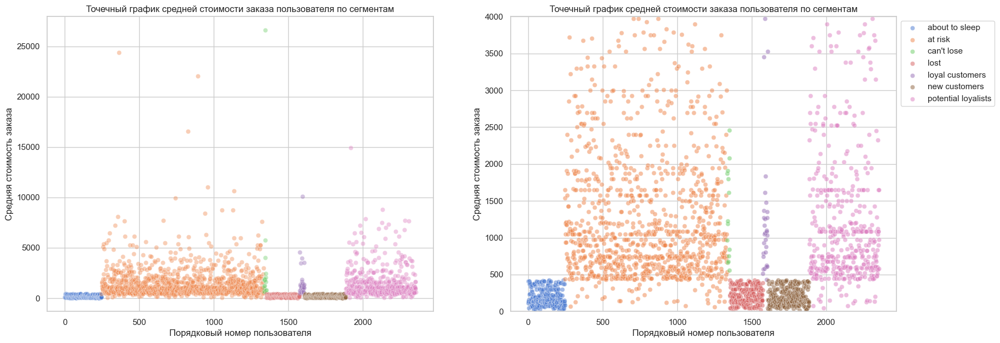

In [104]:
#построим точечную диаграмму среднего чека пользователя
figure, ax = plt.subplots(1,2,figsize=(20,7))
for cat in data_by_customers['segment'].unique():
    data_filtered = data_by_customers.query('segment == @cat')
    ax[0].set(title='Точечный график средней стоимости заказа пользователя по сегментам', xlabel='Порядковый номер пользователя', ylabel='Средняя стоимость заказа')
    sn.scatterplot(data_filtered.index, data_filtered['avg_revenue'], alpha = 0.4,ax=ax[0])
    ax[1].set(title='Точечный график средней стоимости заказа пользователя по сегментам', xlabel='Порядковый номер пользователя', ylabel='Средняя стоимость заказа')
    sn.scatterplot(data_filtered.index, data_filtered['avg_revenue'], alpha = 0.5, label=cat, ax=ax[1])
    plt.ylim(0,4000)
    plt.legend(bbox_to_anchor=(1, 1))
plt.show()

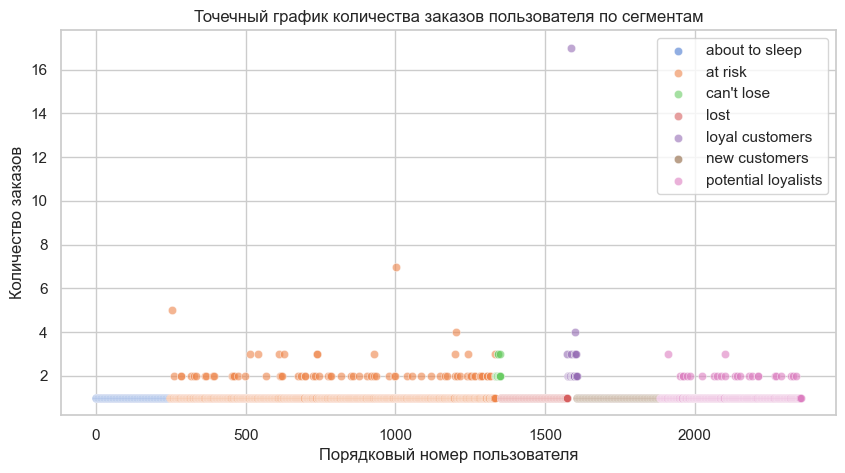

In [105]:
#построим точечную диаграмму заказов на пользователя
figure, ax = plt.subplots(figsize=(10,5))
for cat in data_by_customers['segment'].unique():
    data_filtered = data_by_customers.query('segment == @cat')
    ax.set(title='Точечный график количества заказов пользователя по сегментам', xlabel='Порядковый номер пользователя', ylabel='Количество заказов')
    sn.scatterplot(data_filtered.index, data_filtered['orders'], alpha = 0.6, label=cat)
    plt.legend(bbox_to_anchor=(1, 1))
plt.show()

<div style="border:solid black 1px; padding: 20 px">
В среднем для всех сегментов, за исключением лояльных покупателей и покупателей, которых мы не можем потерять, приходится по 1 заказу на пользователя. Лояльные покупатели и покупатели, которых мы не можем потерять, совершают минимум 2 заказа.
</div>

In [106]:
#посчитаем количество заказов для каждого сегмента по категориям товаров
customers_by_segment_category = data_segment.groupby(
    ['segment','category'], as_index=False).agg({'order_id':'nunique'}).sort_values(['category','order_id'],ascending=False)
#переименуем столбцы
customers_by_segment_category.columns = ['segment','category','orders']
customers_by_segment_category

,segment,category,orders
10,at risk,товары для строительства и ремонта,26
38,potential loyalists,товары для строительства и ремонта,11
20,lost,товары для строительства и ремонта,3
26,loyal customers,товары для строительства и ремонта,3
32,new customers,товары для строительства и ремонта,3
9,at risk,товары для сада и дачи,516
37,potential loyalists,товары для сада и дачи,191
31,new customers,товары для сада и дачи,111
4,about to sleep,товары для сада и дачи,105
19,lost,товары для сада и дачи,52


In [107]:
#отобразим распределение на графике
fig = px.bar(customers_by_segment_category, x='segment', y='orders', color='category', text='orders')
fig.update_layout(title='Распределение количества заказов в категории товаров по сегментам пользователей', yaxis_title='Сегмент', xaxis_title='Количество заказов', yaxis={'categoryorder': 'total ascending'})
fig.show()

<div style="border:solid black 1px; padding: 20 px">
В каждом сегменте наибольшей популярностью пользуются товары следующих категорий:
    
- товары для дома
- товары для сада и дачи
- товары для кухни.
    
"Товары для кухни" попали в тройку лидеров по количеству заказов в сегментах, причем количество уникальных товаров в три раза меньше, чем в категории " товары для дачи и сада". Следовально, данная категория имеет потенциал для роста. В то время "товары для дома" продаются лучше "товаров для сада и дачи" и меньше подвержены влиянию сезонности, возможно стоит перераспределить количество товаров в сторону увеличения уникальных позиций "товаров для дома".
</div>

In [108]:
#средний чек пользователя в сегменте по категориям товаров
df_by_customers = data_segment.groupby(['segment','category','round_month','customer_id'], as_index=False).agg({'order_id':'nunique','revenue':'sum'})
df_by_customers.columns = ['segment','category','round_month','customer_id','orders','revenue']
df_by_customers['avg_revenue'] = df_by_customers['revenue']/df_by_customers['orders']
df_by_customers.sort_values('orders',ascending=False).head()

,segment,category,round_month,customer_id,orders,revenue,avg_revenue
1783,loyal customers,товары для дома,2019-10-01,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,6,4900.0,816.666667
1792,loyal customers,товары для кухни,2019-10-01,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,5,2853.0,570.600000
1817,loyal customers,товары для сада и дачи,2019-10-01,73d1cd35-5e5f-4629-8cf2-3fda829d4e58,5,10759.0,2151.800000
817,at risk,товары для дома,2019-05-01,e0535076-6270-4df2-8621-cb06264a94fa,4,636.0,159.000000
1360,at risk,товары для сада и дачи,2019-04-01,b7b865ab-0735-407f-8d0c-31f74d2806cc,3,2629.0,876.333333


In [109]:
#средний чек по всем пользователям в сегменте в каждой категории товаров
avg_by_month = df_by_customers.groupby(by=['segment','category','round_month'],as_index=False).agg({'avg_revenue':'mean'})
avg_by_month.head()

,segment,category,round_month,avg_revenue
0,about to sleep,комнатные растения,2019-02-01,113.00
1,about to sleep,комнатные растения,2019-03-01,162.25
2,about to sleep,комнатные растения,2019-04-01,190.00
3,about to sleep,комнатные растения,2019-05-01,250.50
4,about to sleep,комнатные растения,2019-06-01,412.00


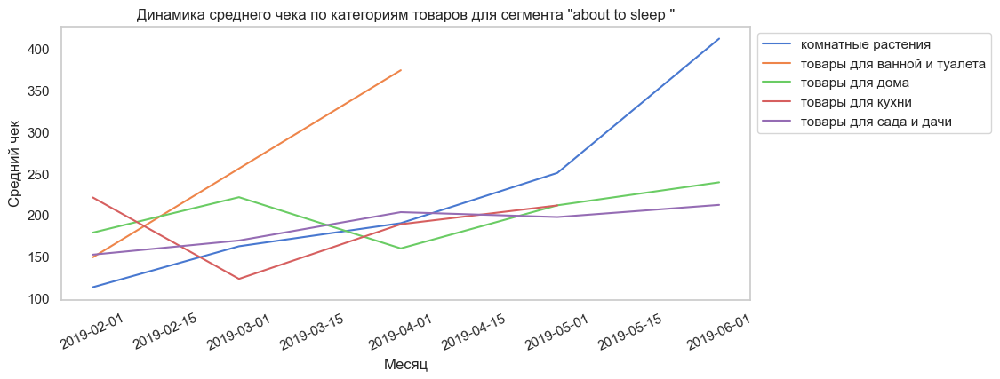

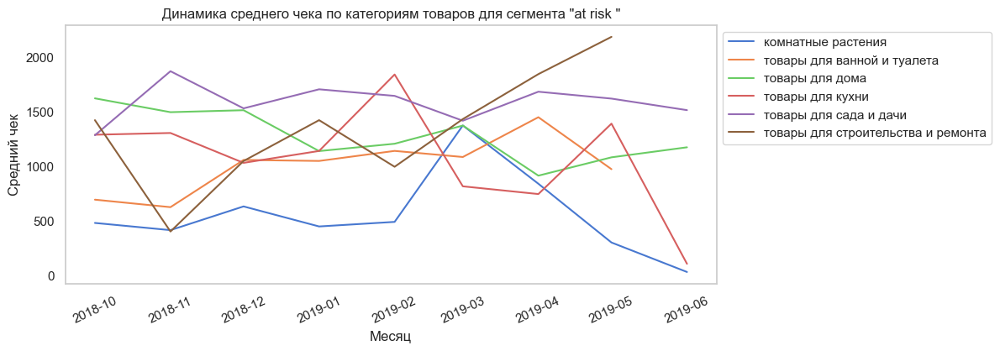

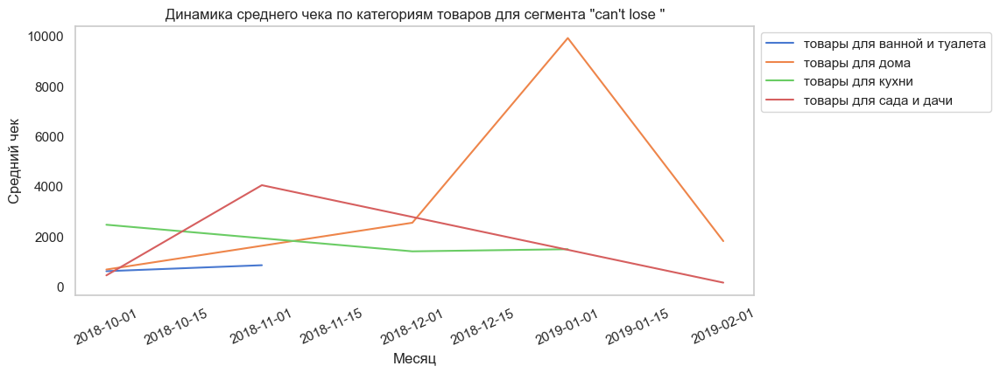

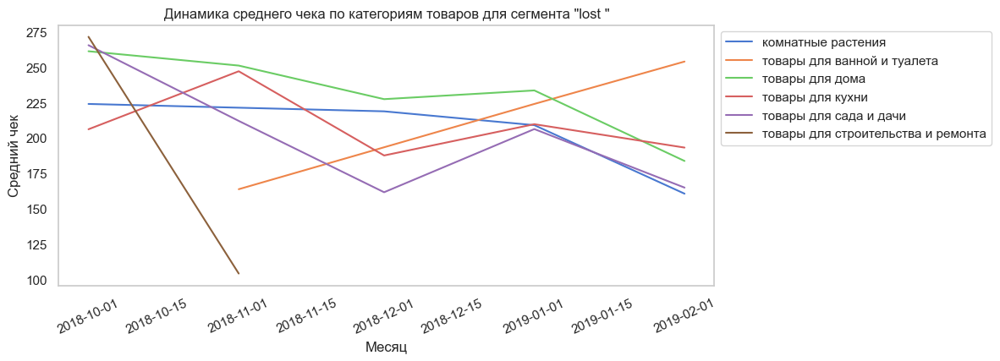

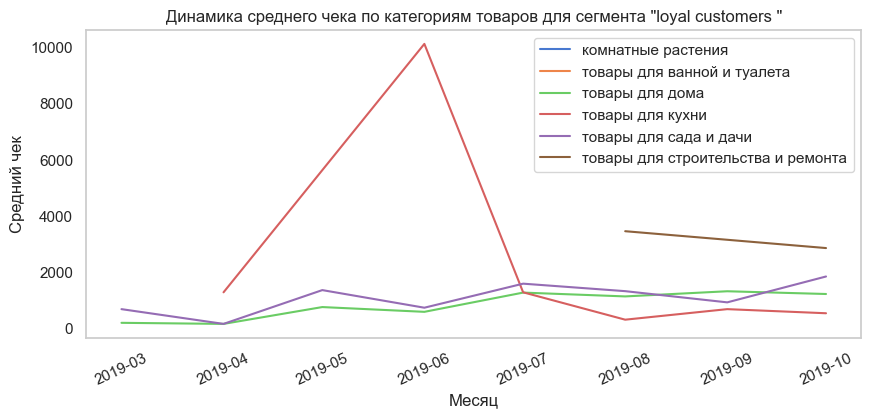

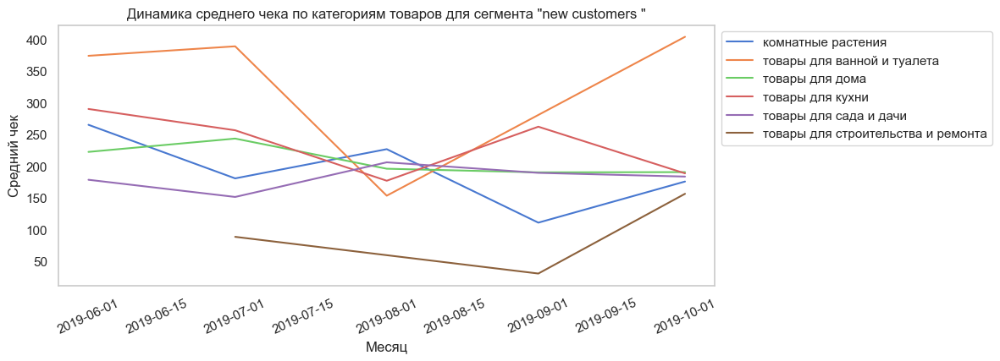

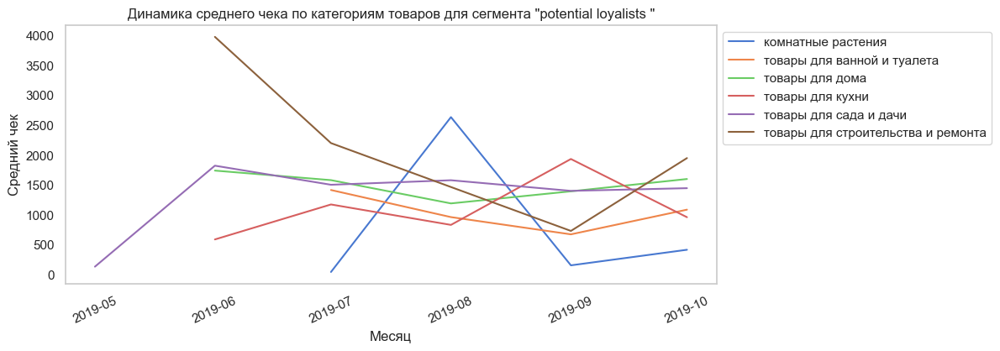

In [110]:
#строим графики
for seg in avg_by_month['segment'].unique():
    data_filtered = avg_by_month.query('segment == @seg')
    plt.figure(figsize=(10,4))
    plt.title(f'Динамика среднего чека по категориям товаров для сегмента \"{seg} \"')
    sn.lineplot(data=data_filtered,x='round_month', y='avg_revenue', hue='category')
    plt.grid()
    plt.xlabel('Месяц')
    plt.ylabel('Средний чек')
    plt.xticks(rotation = 25)
    plt.legend()
    plt.legend(bbox_to_anchor=(1, 1))
    plt.show()

<div style="border:solid black 1px; padding: 20 px">
    
`Loyal customers` имеют стабильный постоянный средний чек по категориям "товары для дома" и "товары для сада и дачи" с марта по октябрь 2019. Категория "товары для кухни" имеет просадку в среднем чеке примерно в два раза (с 07-2019), но до июля данная категория пользовалась большей популярностью (пик среднего чека приходится на июнь - 10000 руб). Товары для строительства и ремонта покупались только с августа по октябрь 2019, при этом средний чек был значительно выше остальных категорий товаров (около 4000 руб).Следует развивать категорию товары для кухни в сегменте лояльных покупателей, чтобы повысить средний чек (представить больше позиций товаров, соответвующих запросам данных клиентов). Устроить информационную рассылку с акционными товарами для строительства и ремонта, чтобы повысть интерес лояльных пользователей к данной категории, а также периодически напоминать о поступлениях товаров данной категории, чтобы сделать спрос постоянным.
    
`Potential loyalist` имеют стабильный средний чек по категориям "товары для дома", "товары для кухни", "товары для сада и дачи" (с июня 2019) , а вот в категориях "комнатные растения" и "товары для строительства и ремонта" наблюдается резкий спад в сентябре. Тем не менее несмотря на значительную просадку в среднем чеке в августе и сентябре, в остальные месяцы "товары для строительства и ремонта" имеют самый высокий средний чек в сегменте. Поэтому рекомендую обратить внимание  на категорию "товары для строительства и ремонта" - она имеет потенциал для развития. Разжигаем интерес пользователей информационными и акционными рассылками, возможно расширяем товарный ассортимент. Напоминаем пользователю о товарах в корзине или о товарах, которым он интересовался и они снова поступили в продажу.
    
`At risk` имеют высокий средний чек в категориях  "товары для сада и дачи", "товары для строительства и ремонта", "товары для дома". Причем для товаров для строительства и ремонта замечен тренд на увеличение среднего чека.Так как данные клиенты покупали часто, но давно, их стоит также попытаться вернуть - письмо с мотивацией к покупке в нашем магазне - "мы скучаем по Вам" и статистика по пользователю (сколько заказов сделано, дата последней покупки), рассылка с персональными скидками в данных категориях, промокод на покупку от 1200 рублей, действительный в течение месяца.
    
`Can’t Lose`  имели высокий средний чек в категории "товары для кухни", "товары для дома" и "товары для сада и дачи". Товары для дома имели пик в январе - средний чек доходит до 10000 руб. Разжигаем интерес пользователей информационными и акционными рассылками с персональными предложениями, предлагаем промокод на покупку от 1500 рублей, действительный в течение месяца. Напоминаем пользователю о товарах в корзине или о товарах, которым он интересовался и они снова поступили в продажу, напоминаем о важности клиента для нашего магазина. Так как пик в категории "товары для дома" наблюдается в праздничный период, то устраиваем праздничную рассылку, возможно пользователи снова совершат крупные покупки.
    
`New customer` имеют самый высокий средний чек в категории "товары для ванной и туалета" и заметна динамика его роста в последние месяцы (с августа 2019), а вот "товары для строительства и ремонта" совсем не пользуются популярностью у новых пользователей.  Остальные категории товаров имеют приблизительно одинаковую популярность.
Возможно стоит устроить рекламную акцию, чтобы привлечь внимание новых пользователей к товарам для строительства и ремонта. Подогревать интерес акционными персональными рассылками. Устроить систему скидок для новых покупателей: 20% на первый заказ , 10% на второй, 5% на третий, чтобы удержать пользователя и перевести его в сегмент лояльного или потенциально лояльного покупателя.
      
`About tо sleep` имеют максимальный средний чек в категориях товаров "товары ванной и туалета" и "товары для кухни". Причем по данным категориям максимальный средний чек около 400 руб, а по остальным категориям товаров в районе 200 руб, что сильно меньше среднего чека лояльных и потенциально лояльных пользователей. Пытаемся привлечь внимание пльзователей информационными и акционными персонализированными рассылками, письмами с мотивацией к посещению магазина (напоминание, что мы скучаем по клиенту).
    
`Lost` максимальный средний чек в категории "товары для дома" и "товары для сада и дачи". Важно отметить, что  пользователи отвалились в течение месяца. Потерянные пользователи имеют средний чек в каждой категории товаров меньше 275 руб, что сильно меньше значений в других сегментах. Попытаемся вернуть пользователей информационной рассылой с акцентом на важности клиента, акционной рассылка с персональными предложениями.
</div>

##  Проверка гипотез

**Сформулируем первую гипотезу.**

Нулевая: различий в среднем чеке между сегментами нет.

Альтернативная: между сегменатми в среднем чеке есть статистически значимые различия.

Уровень значимости - 5%.

Критерий - непараметрический критерий Манна-Уитни st.mannwhitneyu(), так как он устойчив к выбросам. Это означает, что данные ранжируются, выброс будет просто распознаваться как случай, который ранжируется на единицу выше (или ниже) следующего наблюдения, поэтому сильного влияния на p-value выбросы не оказывают.

Так как между собой будут сравниваться 7 сегменов, то тест множественный (21 тест).
При проведении множественного теста, чтобы снизить вероятность ошибки первого рода (нулевая гипотеза неверно отвергнута), необходимо применить поправку к уровню значимости. Будем использовать поправку Бонферрони - уровни значимости в каждом из m сравнений в m раз меньше, чем уровень значимости, требуемый при единственном сравнении. 

In [111]:
# критический уровень статистической значимости
alpha = 0.05
#введем попарвку Бонферрони для множественного теста
bonferroni = 21
#статистический уровень значимости с учетом поправки
bonferroni_alpha = alpha / bonferroni

In [112]:
#функция для проведения теста - средний чек
def st_test(df,seg):

    for i in df['segment'].unique():
        if i not in seg:
            results = stats.mannwhitneyu(
            df[df['segment'] == seg[0]]['avg_revenue'],
            df[df['segment'] == i]['avg_revenue'])
            print(f'Проверка для сегментa {seg[0]} и {i}')
            print('p-значение: {0:.3f}'.format(results.pvalue))

            if results.pvalue < bonferroni_alpha:
                print('Отвергаем нулевую гипотезу: разница статистически значима')
            else:
                print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя'
                ) 
            print(' ')

In [113]:
st_test(data_by_customers, ['loyal customers'])

Проверка для сегментa loyal customers и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa loyal customers и at risk
p-значение: 0.791
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 
Проверка для сегментa loyal customers и can't lose
p-значение: 0.179
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 
Проверка для сегментa loyal customers и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa loyal customers и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa loyal customers и potential loyalists
p-значение: 0.491
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 


In [114]:
st_test(data_by_customers, ['potential loyalists','loyal customers'])

Проверка для сегментa potential loyalists и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa potential loyalists и at risk
p-значение: 0.235
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 
Проверка для сегментa potential loyalists и can't lose
p-значение: 0.057
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 
Проверка для сегментa potential loyalists и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa potential loyalists и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 


In [115]:
st_test(data_by_customers, ['at risk','potential loyalists','loyal customers'])

Проверка для сегментa at risk и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa at risk и can't lose
p-значение: 0.104
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 
Проверка для сегментa at risk и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa at risk и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 


In [116]:
st_test(data_by_customers, ['can\'t lose','at risk','potential loyalists','loyal customers'])

Проверка для сегментa can't lose и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa can't lose и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 
Проверка для сегментa can't lose и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима
 


In [117]:
st_test(data_by_customers, ['new customers','can\'t lose','at risk','potential loyalists','loyal customers'])

Проверка для сегментa new customers и about to sleep
p-значение: 0.347
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 
Проверка для сегментa new customers и lost
p-значение: 0.032
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя
 


In [118]:
st_test(data_by_customers, ['about to sleep','new customers','can\'t lose','at risk','potential loyalists','loyal customers'])

Проверка для сегментa about to sleep и lost
p-значение: 0.002
Отвергаем нулевую гипотезу: разница статистически значима
 


<div style="border:solid black 1px; padding: 20 px">
    
Отвергнуть нулевую гипотезу о различии в среднем чеке между сегментами `new customers` и `about to sleep`, `new customers` и `lost`, `at risk` и `can't lose`, `potential loyalists` и `can't lose`, `potential loyalists` и `at risk`, `loyal customers` и `at risk`, `loyal customers` и `can't lose`, `loyal customers` и `potential loyalists` не получилось. А значит статистически значимой разницы в среднем чеке между сегментами нет.
   
Для остальных групп сравнения разница статистически значима.
</div>

**Сформулируем вторую гипотезу.**

Нулевая: различий в количестве заказов на пользователя между сегментами  нет.

Альтернативная: между сегменатми в количестве заказов на пользователя есть статистически значимые различия.

Уровень значимости - 5%.

Критерий - непараметрический критерий Манна-Уитни st.mannwhitneyu(), так как он устойчив к выбросам. Это означает, что данные ранжируются, выброс будет просто распознаваться как случай, который ранжируется на единицу выше (или ниже) следующего наблюдения, поэтому сильного влияния на p-value выбросы не оказывают.

Так как между собой будут сравниваться 7 сегментов, то тест множественный.
При проведении множественного теста, чтобы снизить вероятность ошибки первого рода (нулевая гипотеза неверно отвергнута), необходимо применить поправку к уровню значимости. Будем использовать поправку Бонферрони - уровни значимости в каждом из m сравнений в m раз меньше, чем уровень значимости, требуемый при единственном сравнении.

In [119]:
# критический уровень статистической значимости
alpha = 0.05
#введем попарвку Бонферрони для множественного теста
bonferroni = 21
#статистический уровень значимости с учетом поправки
bonferroni_alpha = alpha / bonferroni

In [120]:
#функция для проведения теста - количество заказов
def st_test_orders(df,seg):

    for i in df['segment'].unique():
        if i not in seg:
            results = stats.mannwhitneyu(
            df[df['segment'] == seg[0]]['orders'],
            df[df['segment'] == i]['orders'])
            print(f'Проверка для сегментa {seg[0]} и {i}')
            print('p-значение: {0:.3f}'.format(results.pvalue))

            if results.pvalue < bonferroni_alpha:
                print('Отвергаем нулевую гипотезу: разница статистически значима')
            else:
                print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя')
            print('')

In [121]:
st_test_orders(data_by_customers, ['loyal customers'])

Проверка для сегментa loyal customers и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa loyal customers и at risk
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa loyal customers и can't lose
p-значение: 0.675
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя

Проверка для сегментa loyal customers и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa loyal customers и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa loyal customers и potential loyalists
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима



In [122]:
st_test_orders(data_by_customers, ['potential loyalists','loyal customers'])

Проверка для сегментa potential loyalists и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa potential loyalists и at risk
p-значение: 0.189
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя

Проверка для сегментa potential loyalists и can't lose
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa potential loyalists и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa potential loyalists и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима



In [123]:
st_test_orders(data_by_customers, ['at risk','potential loyalists','loyal customers'])

Проверка для сегментa at risk и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa at risk и can't lose
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa at risk и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa at risk и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима



In [124]:
st_test_orders(data_by_customers, ['can\'t lose','at risk','potential loyalists','loyal customers'])

Проверка для сегментa can't lose и about to sleep
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa can't lose и lost
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима

Проверка для сегментa can't lose и new customers
p-значение: 0.000
Отвергаем нулевую гипотезу: разница статистически значима



In [125]:
st_test_orders(data_by_customers, ['new customers','can\'t lose','at risk','potential loyalists','loyal customers'])

Проверка для сегментa new customers и about to sleep
p-значение: 1.000
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя

Проверка для сегментa new customers и lost
p-значение: 1.000
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя



In [126]:
st_test_orders(data_by_customers, ['about to sleep','new customers','can\'t lose','at risk','potential loyalists','loyal customers'])

Проверка для сегментa about to sleep и lost
p-значение: 1.000
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя



<div style="border:solid black 1px; padding: 20 px">
    
Отвергнуть нулевую гипотезу о различии в количестве заказов на клиента между сегментами `can't lose` и `loyal customers`  не получилось. Значит статистически значимой разницы в количестве заказов между сегментами нет. Данные группы клиентов совершают наибольшее количество заказов в магазине - среднее значение 2 (есть клиенты совершившие от 2 и более заказов).
    
Статистически значимой разницы не обнаружено в количестве заказов на пользователя между сегментами `potential loyalists` и `at risk`. Данные сегменты совершают в среднем 1 заказ на клиента (но есть клиенты и с количеством заказов >2, но таких мало). 
    
Статистически значимой разницы не обнаружно между сегментами `about to sleep` и `lost`, `new customers` и `lost`, `new customers` и `about to sleep`. Среднее значение количества заказов на пользователя для данных групп - 1.
    
Для остальных групп анализ данных показал, что в среднем количестве заказов на посетителя между сегмантами есть статистически значимые различия. 
    
</div>

<div style="border:solid green 2px; padding: 20 px">
    
##  Общий вывод

1. Были проанализированы данные о 6 737 транзакциях в интернет-магазине товаров для дома и быта «Пока все ещё тут» с информацией о дате заказа, идентификаторах покупателей и заказов, наименованиях купленных товаров, количестве товара в заказе и его цене. 
    
Анализируемый период с 1 октября 2018 года по 31 октября 2019 года. В данный промежуток покупки в интернет-магазине производил 2451 клиент, совершено  2784 заказов ( при этом в одном заказе могут быть товары разных категорий). Кроме того, один пользователь мог совершить несколько заказов в анализируемый период. Всего в датафрейме 2343 уникальных товаров.
    
2. В результате преобработки данных столбец `date` был приведен к специальному типу данных datetime.

- Из анализа исключены строки-дубликаты по всем столбцам кроме даты (сохранена последняя строка).
    
- Из анализа исключены пользователи, для которых `order_id` был не уникальным (то есть order_id повторялся для разных пользователей) - 29 пользователей.
    
- Пользователи с заказами, где количество товаров больше 30 (верхняя граница), исключены из исследования, так как это крупные оптовые покупки, и они будут оказывать влияние на персонализированные предложения для покупателей.
    
- Товары с аномально высокой стоимостью позиции (товары для строительства) и аномально низкой (рассада) не исключены из рассмотрения, так как пользователи, которые покупают данные товары, кажутся довольно привлекательным сегментом.
    
Таким образом, в результате преобработки данных из рассмотрения было исключено 32.27% строк (было строк - 6737, стало - 4563), 3,92% уникальных пользователей и 8,3% уникальных заказов.
   
3. При помощи лемматизовации и подсчета популярных слов было выделено 6 категорий:
    
- товары для дома (текстиль, хранение, техника);
- товары для кухни (посуда, средства и техника для кухни);
- товары для сада и дачи (рассада, растения, приспособления для дачи);
- товары для ванной и туалета (сантехника, уборка и чистота, средства для гигиены);
- комнатные растения (растения в горшках);
- товары для строительства и ремонта (стремянки, крепеж и инструменты).
    
Каждой позиции в заказе присвоена соответвующая категория.
    
4. В результате исследовательского анализа выяснили:

- Наибольшее количество уникальных товаров имеется в категории "товары для сада и дачи" - 947, на втором и третьем месте "товары для дома" - 753 и "товары для кухни" - 342. Остальные категории товаров имеют меньше 100 уникальных позиций.
   
- Наибольшую выручку принесли следующие категории: "товары для дома" - 41%, "товары для сада и дачи" - 41%, "товары для кухни" - 11%. Оставшиеся категории принесли в среднем по 2%.
    
- В каждой категории в среднем на пользователя приходится 1 заказ.
    
- Крупные заказы присутсвуют в категориях "товары для дома", "товары для сада и дачи" и "товары для кухни".
    
- За весь временной период "товары для дома" принесли выручку около 1.2 млн, "товары для сада и дачи" около 1.2 млн., а "товары для кухни" - 200 тыс. Оставшиеся категории принесли выручку меньше 100 тыс.
    
- По графикам динамики было выявлено, что тип продажи товаров для сада и дачи приходится с апреля по май, в то время как "товары для дома"  и "товары для кухни" пользуются большей популярностью в зимний период времени. Остальные категории меньше подвержены сезонности и приносят в среднем постоянную выручку в каждый месяц.
    
- Наибольший средний чек имеют следующие категории товаров: товары для сада и дачи, товары для дома и товары для кухни. Заметны большие пики для категории "товары для строительства и ремонта" в июне и августе, что обусловлено крупными покупками (стремянки COLOMBO двумя пользователями).
    
- Заметен общий тренд на снижение суммарной выручки магазина на 20% (октября 2018 - октябрь 2019).
    
- Максимальное количество заказов наблюдается в период с февраля по апрель 2019 (примерно 250 заказов каждый месяц).
    
- Пик количества уникальных пользователей, как и пик количества заказов, приходится на февраль-апрель 2019. КОличество пользователей каждый месяц не опускается ниже 160.

- Общий тренд среднего чека: макимальный средний чек в ноябре, монотонное снижение до февраля, сильная просадка с февраля по апрель, рост с апреля по июнь, и опять снижение к сентябрю. Средний чек в октябре 2018 выше на 10% среднего чека в октябре 2019 (количество заказов осталось примерно на одном уровне, а вот позиции товаров, которые заказывают пользователи, видимо стали дешевле).
    
5.При помощи RFM анализа (признаки: `recency` - давность покупки,  и `monetary` - общая сумма покупок пользователя, по `frequency` - частота покупки) пользователли поделены на 7 сегментов. Описание сегментов представлено ниже.
    
**Loyal Customers** Покупают на регулярной основе. Отзывчивы к рекламным акциям.

**Potential Loyalists** Недавние покупатели, со средней частотой покупок.

**New customers (Recent Customers)** Покупали совсем недавно, но не часто.

**About To Sleep** Давность и частота покупок ниже среднего. Вы потеряете их, если не активируете повторно.

**At Risk** Покупали часто (на регулярной основе), но давно. Нужно вернуть их обратно!

**Can’t Lose** Они часто покупали, но долгое время не возвращались.

**Lost** Последняя покупка была давно и они не вернулись.
    
6. В ходе исследовательского анализа сегментов выяснили, что:
    
- Наибольшее количество пользователей имеется в сегменте "at risk" - 1088, лояльных покупателей всего 32, а вот потенциально лояльных  - 470, новых покупателей - 278, потерянных клиентов - 223. Покупателей, которые находятся в спящем режиме - 247. 17 клиентов попали в сегмент "Can’t Lose".
    
- Больше всего заказов совершено в категории "at risk" - 1185, что вполне логично, ведь она лидер по количеству пользователей. Лояльные покупатели совершили 86 заказов, что в 2,6 раз больше количества пользователей в данном сегменте, аналогично и для сегмента "Can’t Lose" - 37 заказов (17 пользователей).  Потерянные пользователи и пользователи, переходящие в спящий режим, совершили ровно по одному заказу - 223 и 247. Новые покупали и потенциально лояльные по 278 и 497 заказов соответственно.
    
- Лидер по среднему чеку сегмент "Can’t Lose" - 3236 руб. Примерно на одном уровне находятся средние чеки сегментов  "loyal customers", "at risk" и "potential loyalist", - 1645, 1572 и 1564 руб соответственно. Потерянные, спящие клиенты и новые покупали имеют средний чек в районе 200 руб.
    
- В среднем для всех сегментов, за исключением лояльных покупателей и покупателей, которых мы не можем потерять, приходится по 1 заказу на пользователя. Лояльные покупатели и покупатели, которых мы не можем потерять, совершают минимум 2 заказа.
    
- В каждом сегменте наибольшей популярностью пользуются товары следующих категорий (по числу заказов):
1)товары для дома;
2)товары для сада и дачи;
3)товары для кухни.
    
- Проанализирована динамика среднего чека и составлены рекомендации для покупателей каждого сегмента.
 
7. Сформулированы и проверены две гипотезы (множественный тест - 21, критерий - параметрический критерий Манна-Уитни, уровень значимости - 5%, введен учет поправки Бонферрони).

**Первая гипотеза**

Нулевая: различий в среднем чеке между сегментами нет.

Альтернативная: между сегменатми в среднем чеке есть статистически значимые различия.
    
Для следующих пар `new customers` и `about to sleep`, `new customers` и `lost`, `at risk` и `can't lose`, `potential loyalists` и `can't lose`, `potential loyalists` и `at risk`, `loyal customers` и `at risk`, `loyal customers` и `can't lose`, `loyal customers` и `potential loyalists` статистически значимой разницы в среднем чеке между сегментами не обнаружено. Для остальных групп сравнения разница статистически значима.
    
**Вторая гипотеза**

Нулевая: различий в количестве заказов на пользователя между сегментами нет.

Альтернативная: между сегменатми в количестве заказов на пользователя есть статистически значимые различия.
    
Статистически значимой разницы в количестве заказов между сегментами `can't lose` и `loyal customers` нет. Данные группы клиентов совершают наибольшее количество заказов в магазине - среднее значение 2 (есть клиенты совершившие от 2 и более заказов).

Статистически значимой разницы не обнаружено в количестве заказов на пользователя между сегментами `potential loyalists` и `at risk`. Данные сегменты совершают в среднем 1 заказ на клиента (но есть клиенты и с количеством заказов >2, но таких мало).

Статистически значимой разницы не обнаружно между сегментами `about to sleep` и `lost`, `new customers` и `lost`, `new customers` и `about to sleep`. Среднее значение количества заказов на пользователя для данных групп - 1.

Для остальных групп анализ данных показал, что в среднем количестве заказов на пользователя между сегмантами есть статистически значимые различия.

**Рекомендации для каждого сегментами представлены ниже.**

</div>

<div style="border:solid green 2px; padding: 20 px">
    
##  Рекомендации

`Loyal customers` - 32 клиента, 86 заказов, среднее количество заказов на пользователя - 2,69. Самые популярые категории товаров (по количеству заказов): 1)товары для сада и дачи, 2) товары для дома, 3) товары для кухни.
    
Имеют стабильный постоянный средний чек по категориям "товары для дома" и "товары для сада и дачи" с марта по октябрь 2019. Категория "товары для кухни" имеет просадку в среднем чеке примерно в два раза (с 07-2019), но до июля данная категория пользовалась большей популярностью (пик среднего чека приходится на июнь - 10000 руб). Товары для строительства и ремонта покупались только с августа по октябрь 2019, при этом средний чек был значительно выше остальных категорий товаров (около 4000 руб).
    
Следует развивать категорию товары для кухни в сегменте лояльных покупателей, чтобы повысить средний чек (представить больше позиций товаров, соответвующих запросам данных клиентов). Устроить информационную рассылку с акционными товарами для строительства и ремонта, чтобы повысть интерес лояльных пользователей к данной категории, а также периодически напоминать о поступлениях товаров данной категории, чтобы сделать спрос постоянным. 

*товары для кухни по графику динамики имеют больший спрос в осенне-зимние месяцы (октябрь-апрель), поэтому больше стимулируем пользователей совершать покупки именно в этот период
    
`Potential loyalist` - 470 клиентов, 497 заказов, среднее количество заказов на пользователя - 1,06. Самые популярые категории товаров (по количеству заказов): 1)товары для дома, 2) товары для сада и дачи, 3) товары для кухни.
    
Имеют стабильный средний чек по категориям "товары для дома", "товары для кухни", "товары для сада и дачи" (с июня 2019) , а вот в категориях "комнатные растения" и "товары для строительства и ремонта" наблюдается резкий спад в сентябре. Тем не менее несмотря на значительную просадку в среднем чеке в августе и сентябре, в остальные месяцы "товары для строительства и ремонта" имеют самый высокий средний чек в сегменте. 
    
Поэтому рекомендую обратить внимание  на категорию "товары для строительства и ремонта" - она имеет потенциал для развития. Разжигаем интерес пользователей информационными и акционными рассылками, возможно расширяем товарный ассортимент. Напоминаем пользователю о товарах в корзине или о товарах, которым он интересовался и они снова поступили в продажу. Стимулируем пользователей перейти в сегмент лояльных покупателей рассылами с персональными предложениями, а также промокодами на заказ от 1000 руб.
    
`At risk` - 1088 клиентов, 1185 заказов, среднее количество заказов на пользователя - 1,09. Самые популярые категории товаров (по количеству заказов): 1)товары для дома, 2) товары для сада и дачи, 3) товары для кухни.
    
Имеют высокий средний чек в категориях  "товары для сада и дачи", "товары для строительства и ремонта", "товары для дома". Причем для товаров для строительства и ремонта замечен тренд на увеличение среднего чека.
    
Так как данные клиенты покупали часто, но давно, их стоит также попытаться вернуть - письмо с мотивацией к покупке в нашем магазне - "мы скучаем по Вам" и статистика по пользователю (сколько заказов сделано, дата последней покупки), рассылка с персональными скидками в данных категориях, промокод на покупку от 1200 рублей, действительный в течение месяца.

*товары для сада и дачи - сезонный товар, больший спрос имеют с апреля по июнь,товары для дома имеют больший спрос в осенне-зимние месяцы (октябрь-май) -> стимулируем пользователей совершать покупки именно в этот период
    
`Can’t Lose`  - 17 клиентов, 37 заказов, среднее количество заказов на пользователя - 2,18. Самые популярые категории товаров (по количеству заказов): 1)товары для дома, 2) товары для кухни, 3) товары для сада и дачи.
    
Имели высокий средний чек в категории "товары для кухни", "товары для дома" и "товары для сада и дачи". Товары для дома имели пик в январе - средний чек доходит до 10000 руб. 
    
Разжигаем интерес пользователей информационными и акционными рассылками с персональными предложениями, предлагаем промокод на покупку от 1500 рублей, действительный в течение месяца. Напоминаем пользователю о товарах в корзине или о товарах, которым он интересовался и они снова поступили в продажу, напоминаем о важности клиента для нашего магазина. Так как пик в категории "товары для дома" наблюдается в праздничный период, то устраиваем праздничную рассылку, возможно пользователи снова совершат крупные покупки.

*товары для сада и дачи - сезонный товар, больший спрос имеют с апреля по июнь,товары для дома и кухни имеют больший спрос в осенне-зимние месяцы (октябрь-май) -> стимулируем пользователей совершать покупки именно в этот период
    
`New customer` - 278 клиентов, 278 заказов, среднее количество заказов на пользователя - 1,00. Самые популярые категории товаров (по количеству заказов): 1)товары для сада и дачи, 2)товары для дома, 3) товары для кухни.
    
Имеют самый высокий средний чек в категории "товары для ванной и туалета" и заметна динамика его роста в последние месяцы (с августа 2019), а вот "товары для строительства и ремонта" совсем не пользуются популярностью у новых пользователей.  Остальные категории товаров имеют приблизительно одинаковую популярность.
    
Рекомендую устроить рекламную акцию, чтобы привлечь внимание новых пользователей к товарам для строительства и ремонта. Подогревать интерес акционными персональными рассылками. Устроить систему скидок для новых покупателей: 20% на первый заказ , 10% на второй, 5% на третий, чтобы удержать пользователя и перевести его в сегмент лояльного или потенциально лояльного покупателя.
    
*товары для сада и дачи - сезонный товар, больший спрос имеют с апреля по июнь,товары для дома и кухни имеют больший спрос в осенне-зимние месяцы (октябрь-май) -> стимулируем пользователей совершать покупки именно в этот период
      
`About tо sleep` - 243 клиента, 247 заказов, среднее количество заказов на пользователя - 1,00. Самые популярые категории товаров (по количеству заказов): 1)товары для сада и дачи, 2)товары для дома, 3) товары для кухни.
    
Имели максимальный средний чек в категориях товаров "товары ванной и туалета" и "товары для кухни". Причем по данным категориям максимальный средний чек около 400 руб, а по остальным категориям товаров в районе 200 руб, что сильно меньше среднего чека лояльных и потенциально лояльных пользователей. 
    
Пытаемся привлечь внимание пльзователей информационными и акционными персонализированными рассылками, письмами с мотивацией к посещению магазина (напоминание, что мы скучаем по клиенту).
    
*товары для дома и кухни имеют больший спрос в осенне-зимние месяцы (октябрь-май) -> стимулируем пользователей совершать покупки именно в этот период
    
`Lost` - 223 клиента, 223 заказов, среднее количество заказов на пользователя - 1,00. Самые популярые категории товаров (по количеству заказов): 1)товары для дома, 2)товары для сада и дачи, 3) товары для кухни.
    
Максимальный средний чек в категории "товары для дома" и "товары для сада и дачи". Важно отметить, что  пользователи отвалились в течение месяца. Потерянные пользователи имеют средний чек в каждой категории товаров меньше 275 руб, что сильно меньше значений в других сегментах. 
    
Попытаемся вернуть пользователей информационной рассылой с акцентом на важности клиента, акционной рассылка с персональными предложениями.
    
*товары для сада и дачи - сезонный товар, больший спрос имеют с апреля по июнь,товары для дома и кухни имеют больший спрос в осенне-зимние месяцы (октябрь-май) -> стимулируем пользователей совершать покупки именно в этот период
    
**Глобальные рекомендации по товарным категориям**
   
"Товары для кухни" попали в тройку лидеров по количеству заказов в сегментах, причем количество уникальных товаров в три раза меньше, чем в категории " товары для дачи и сада". Следовально, данная категория имеет потенциал для роста - увеличить предлагаемый ассортимент.

"Товары для дома" продаются лучше "товаров для сада и дачи" и меньше подвержены влиянию сезонности, возможно стоит перераспределить количество товаров в сторону увеличения уникальных позиций "товаров для дома", а также увеличивать ассортимент "товаров для сада и дачи только" в сезон.
    
Расширить ассортимент в категории "товары для строительства и ремонта, мебель" - найти более дешевые аналоги представленных товаров или найти поставщиков с более низкими ценами на уже представленные товары (тем самым предоставив клиенту более широкий выбор), чтобы привлечь большее число клиентов в этот сегмент, и тем самым, возможно, увеличить доходность категории.
    
В дачный сезон для всех сегментов устраивать рассылку с "товарами для сада и дачи" - это сезонный товар, и стоит акцентировать внимание покупателя на нем с апреля по июнь.
    

</div>

Прикрепляю ссылку на дашборд:

https://public.tableau.com/shared/YR37ZXY55?:display_count=n&:origin=viz_share_link